# Optimizing Spend Budget by Market

In this notebook, we optimize the amount spent in each marketing region to maximize the number of installations for each spend/CPI. 

#### Import Packages

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as py
py.init_notebook_mode()
%matplotlib inline
from matplotlib import pyplot
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from math import sqrt
from random import sample

## Previous Model

#### Processing the tables

In [2]:
#Preprocessing function for all data

def preprocessing(df):
    """Cleans data according to domain and technical requirements."""

    # Converting 'Day' into a date
    df['Month'] = pd.to_datetime(df['Day']).dt.month_name()

    # renaming column per Chelsea's instructions
    df.rename(columns={'Country or Region': "Market"}, inplace=True)
    
    # add boolean is_FUDJEIN column
    fudjein_bool = df.Market.isin(['FR', 'DE', 'GB', 'JP', 'US', 'IN'])
    df['is_FUDJEIN'] = fudjein_bool
    
    #remove all zero values
    df = df[(df['Installs'] > 0)][(df['Spend'] > 0)]
    
    #aggregate weekly
    df['Date'] = pd.to_datetime(df['Day'])

    
    #NVM:
    #Add CPI to table
    #df['CPI'] = df['Spend'].div(df['Installs']) 
    #Deal with division by 0.
    #df.loc[~np.isfinite(df['CPI']), 'CPI'] = 0
            
    return df[['Installs', 'Spend', 'Market', 'Month', 'is_FUDJEIN', 'Date']]

In [3]:
#Read in data sets and merge the tables
a = pd.read_csv('Maps 2018 data.csv')
b = pd.read_csv('2019 Maps Data.csv')
c = pd.read_csv('6 month data pull for dashboard (3).csv')
df = pd.concat([a,b,c], ignore_index = True)

In [4]:
#Preprocess the merged table
df = preprocessing(df)
df.head()

C:\Users\ELDA~1.PER\AppData\Local\Temp/ipykernel_32468/307009679.py:17: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,Installs,Spend,Market,Month,is_FUDJEIN,Date
0,189,119.34,US,August,True,2018-08-17
1,426,200.70,US,September,True,2018-09-29
2,107,100.22,FR,December,True,2018-12-26
6,572,205.65,US,July,True,2018-07-03
10,233,202.45,US,May,True,2018-05-23


In [5]:
#Number of values for each month

df.Month.value_counts().tail()

April       5169
January     5082
March       4856
June        4582
February    4372
Name: Month, dtype: int64

In [6]:
#Number of unique markets

df.Market.value_counts().head()

JP    8365
US    7973
CA    7392
VN    6164
TH    5429
Name: Market, dtype: int64

In [7]:
#Initialize list of sub dataframes

list_of_dfs = []

for month in np.sort(df.Month.unique()):
    for market in np.sort(df.Market.unique()):
        
        #Set the value for each parameter
        month_boolean = df['Month'] == month
        market_boolean = df['Market'] == market

        #Split data according to set parameters and add to list
        if df[month_boolean & market_boolean].shape[0] >0:
            list_df = df[month_boolean & market_boolean]
            list_df = list_df.drop(columns = 'is_FUDJEIN')
            list_of_dfs += [list_df]

print('Number of dataframe: ' + str(len(list_of_dfs)))
print('Shape of first dataframe: ' + str(list_of_dfs[0].shape))

Number of dataframe: 368
Shape of first dataframe: (9, 5)


In [8]:
#Wait on running. NOTE also do yearly data and not monthly for each market. let chelsea know the shape/send screenshots.
#Rn: run markets without months to check if weird numbers.If weird, by quarter.

#Add aggregate table
all_combos = df[['Installs', 'Spend', 'Market', 'Month', 'Date']]
all_combos['Market'] = 'All Markets'
all_combos['Month'] = 'All Months'
list_of_dfs += [all_combos]

#Add aggregate markets for each month
agg_table_month = df[['Installs', 'Spend', 'Market', 'Month', 'Date']]
agg_table_month['Market'] = 'All Markets'
for month in np.sort(df.Month.unique()):
    #Set the value for each parameter
    month_boolean = df['Month'] == month
    #Split data according to set parameters and add to list
    list_of_dfs += [agg_table_month[month_boolean]]
    
#Add aggregate months for each market
agg_table_market = df[['Installs', 'Spend', 'Market', 'Month', 'Date']]
agg_table_market['Month'] = 'All Months'
for market in np.sort(df.Market.unique()):
    #Set the value for each parameter
    market_boolean = df['Market'] == market
    #Split data according to set parameters and add to list
    list_of_dfs += [agg_table_market[market_boolean]]
    
#Add aggregate markets FUDJEIN for each month
fudjein = df[['Installs', 'Spend', 'Market', 'Month', 'Date']][df['is_FUDJEIN'] == True]
fudjein['Market'] = 'FUDJE+IN'
for month2 in np.sort(df.Month.unique()):
    #Set the value for each parameter
    month_boolean2 = df['Month'] == month2
    #Split data according to set parameters and add to list
    list_of_dfs += [fudjein[month_boolean2]]

print('Number of dataframe: ' + str(len(list_of_dfs)))
print('Shape of first dataframe: ' + str(list_of_dfs[-1].shape))

C:\Users\ELDA~1.PER\AppData\Local\Temp/ipykernel_32468/111538885.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ELDA~1.PER\AppData\Local\Temp/ipykernel_32468/111538885.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ELDA~1.PER\AppData\Local\Temp/ipykernel_32468/111538885.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pyd

Number of dataframe: 452
Shape of first dataframe: (2940, 5)


In [9]:
list_of_dfs[1]

,Installs,Spend,Market,Month,Date
731243,293,200.70,AU,April,2019-04-10
731862,254,132.98,AU,April,2019-04-08
731979,246,211.95,AU,April,2019-04-06
740222,14,5.62,AU,April,2019-04-15
741593,960,374.66,AU,April,2019-04-14
...,...,...,...,...,...
2146007,355,227.14,AU,April,2021-04-03
2146500,224,144.78,AU,April,2021-04-29
2157812,5,6.34,AU,April,2021-04-08
2157823,5,1.43,AU,April,2021-04-29


In [10]:
#Aggregate all to weekly level

for k in range(len(list_of_dfs)):
    list_of_dfs[k] = list_of_dfs[k].groupby([pd.Grouper(key='Date', freq='W')]).agg({'Installs': 'sum', 'Spend': 'sum',  
                                                    'Market': 'max', 'Month':'max'})
    list_of_dfs[k] = list_of_dfs[k][(list_of_dfs[k]['Installs'] > 0)][(list_of_dfs[k]['Spend'] > 0)]
list_of_dfs[1]

C:\Users\ELDA~1.PER\AppData\Local\Temp/ipykernel_32468/821131085.py:6: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,Installs,Spend,Market,Month
Date,,,,
2019-04-07,11443,6711.42,AU,April
2019-04-14,14170,6512.25,AU,April
2019-04-21,14484,5735.18,AU,April
2019-04-28,14465,5655.71,AU,April
2019-05-05,3897,1487.80,AU,April
2021-04-04,2313,1560.13,AU,April
2021-04-11,4018,2200.11,AU,April
2021-04-18,3787,2216.10,AU,April
2021-04-25,3370,2204.70,AU,April


In [11]:
list_of_dfs

[            Installs  Spend Market  Month
 Date                                     
 2021-05-02       299  64.61     AR  April,
             Installs    Spend Market  Month
 Date                                       
 2019-04-07     11443  6711.42     AU  April
 2019-04-14     14170  6512.25     AU  April
 2019-04-21     14484  5735.18     AU  April
 2019-04-28     14465  5655.71     AU  April
 2019-05-05      3897  1487.80     AU  April
 2021-04-04      2313  1560.13     AU  April
 2021-04-11      4018  2200.11     AU  April
 2021-04-18      3787  2216.10     AU  April
 2021-04-25      3370  2204.70     AU  April
 2021-05-02      2205  1595.59     AU  April,
             Installs    Spend Market  Month
 Date                                       
 2019-04-07      9855  6180.15     CA  April
 2019-04-14      8483  4437.38     CA  April
 2019-04-21     10118  4945.90     CA  April
 2019-04-28     13169  5652.82     CA  April
 2019-05-05      4094  1472.96     CA  April
 2021-04-04   

#### Visualizing the Spend vs Install Relationships

They all appear to be sufficiently linear.

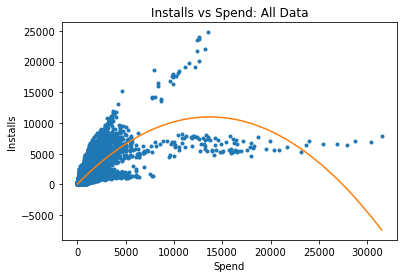

In [12]:
#Scatterplot with fit of full data
df = df.sort_values(by = 'Spend')
a,b,c = np.polyfit(df.Spend, df.Installs, 2)

plt.plot(df.Spend, df.Installs, '.')
plt.plot(df.Spend, a * df.Spend**2 + b*df.Spend + c, '-')
plt.xlabel("Spend")
plt.ylabel("Installs")
plt.title("Installs vs Spend: All Data")
plt.show()

#### Fit each dataframe.

April AR


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



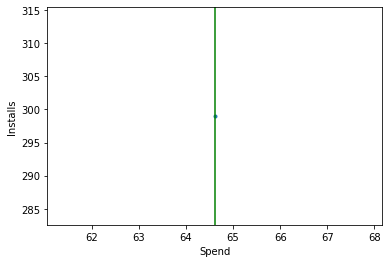

April AU


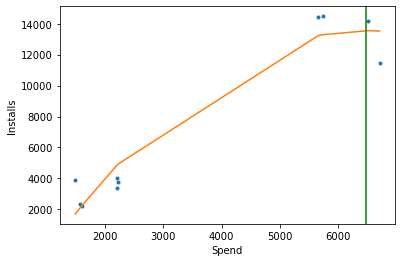

April CA


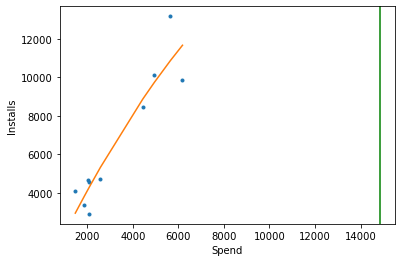

April CO


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



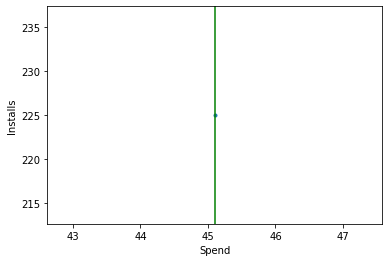

April DE


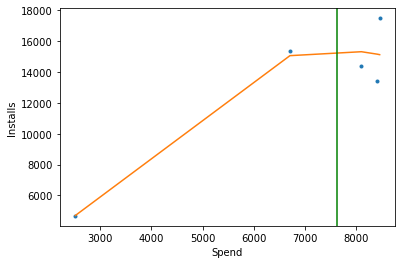

April ES


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



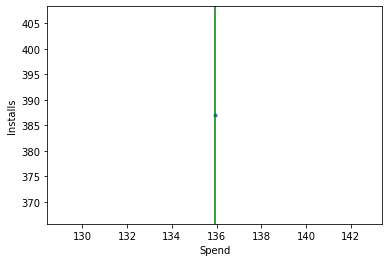

April FR


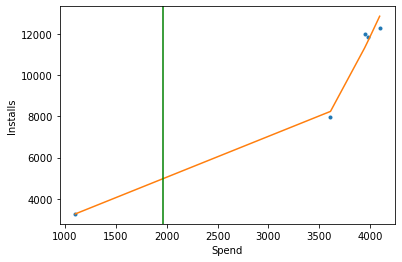

April GB


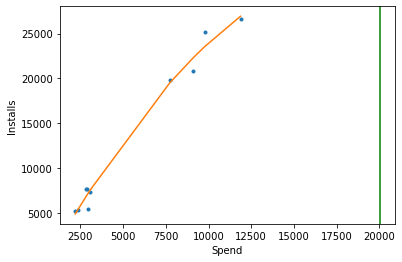

April ID


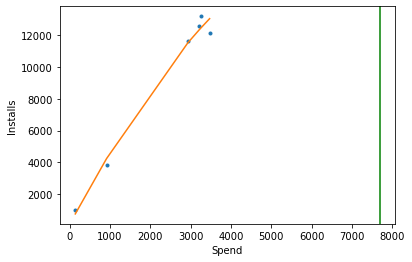

April IN


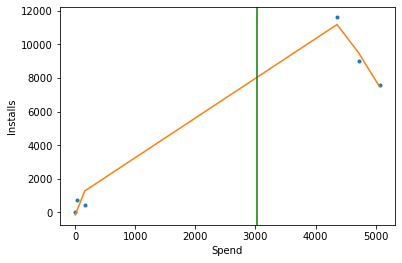

April IT


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



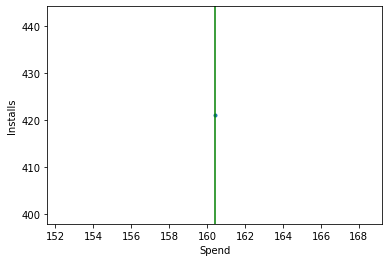

April JP


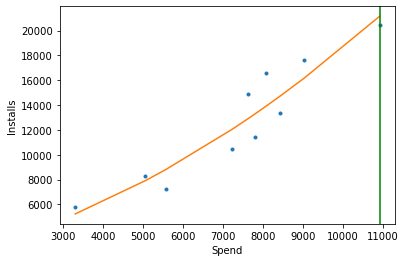

April MX


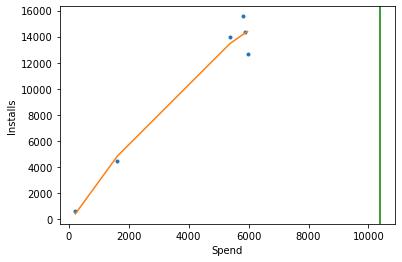

April MY


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



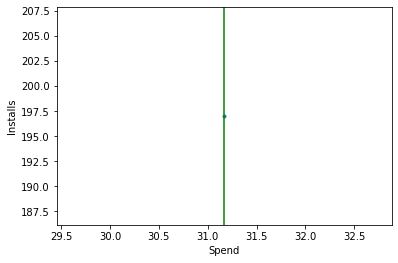

April PH


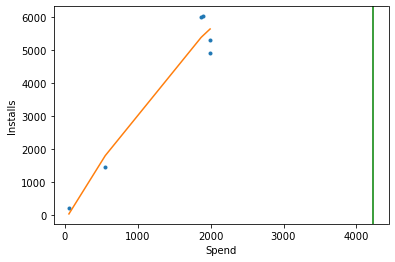

April PK


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



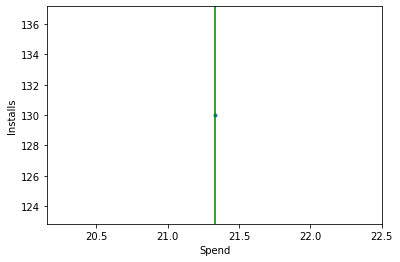

April SA


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



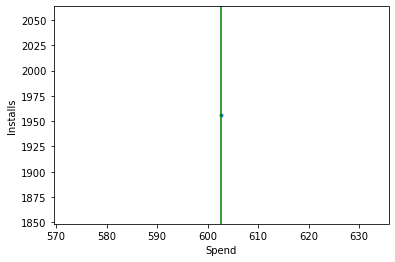

April TH


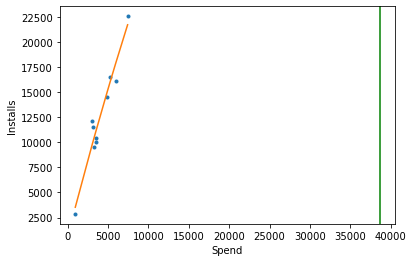

April US


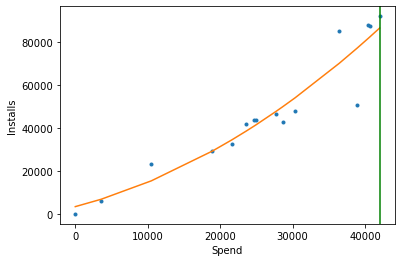

April VN


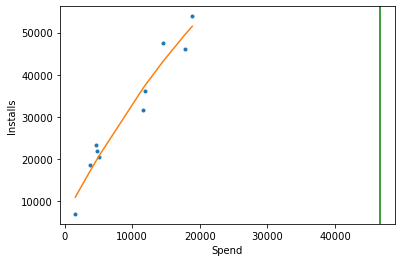

August AE


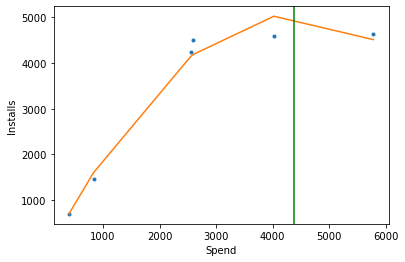

August AU


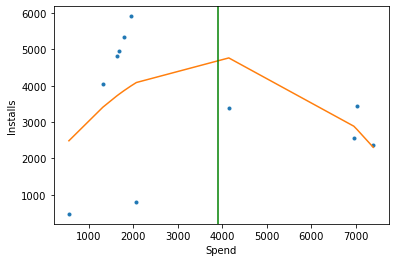

August CA


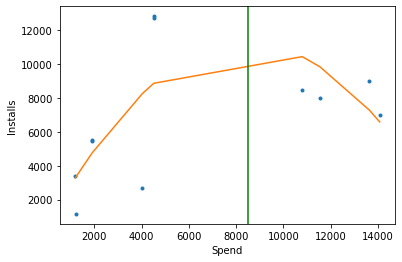

August DE


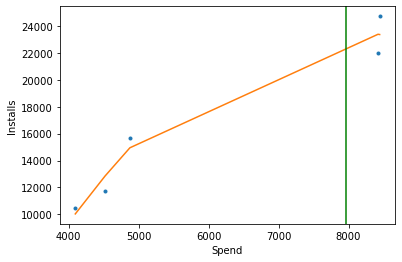

August DK


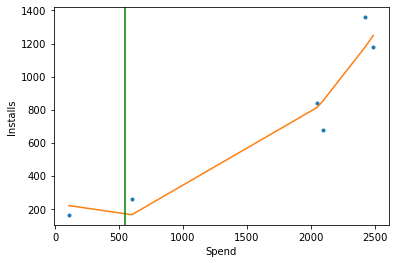

August ES


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



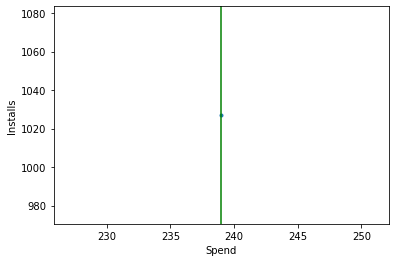

August FR


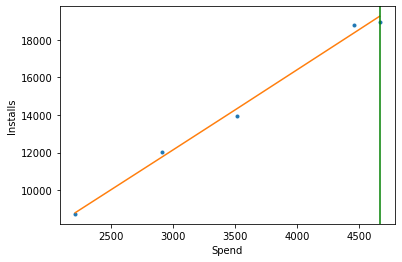

August GB


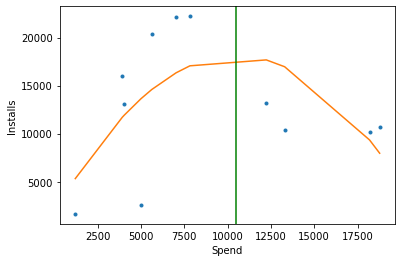

August ID


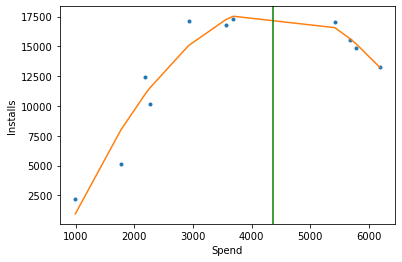

August IN


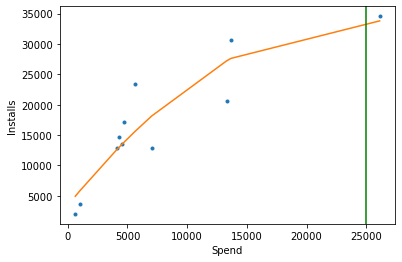

August IT


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



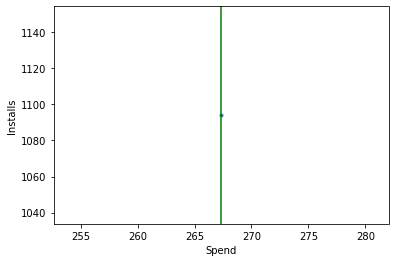

August JP


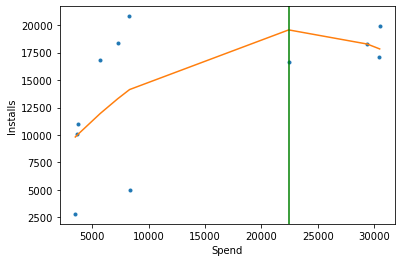

August KR


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



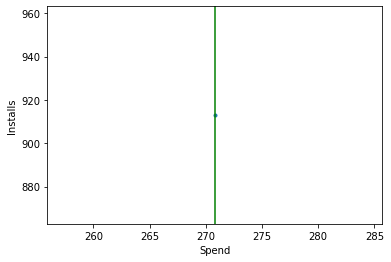

August MX


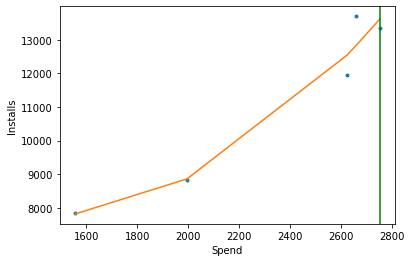

August NO


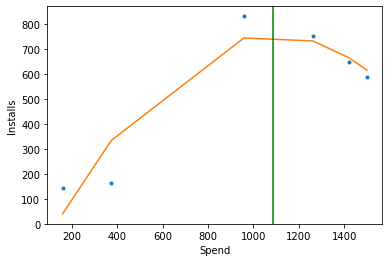

August PH


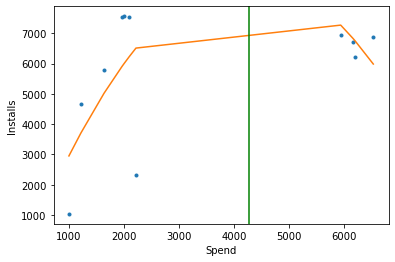

August RU


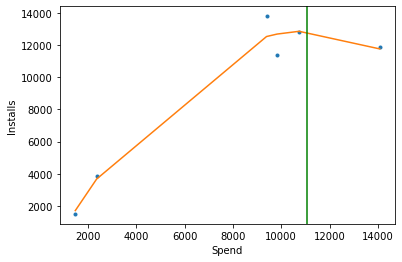

August SA


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



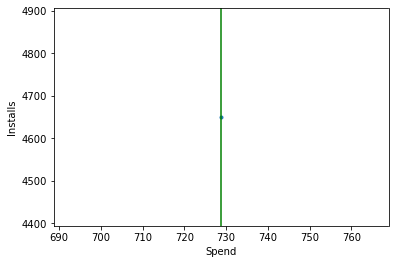

August SE


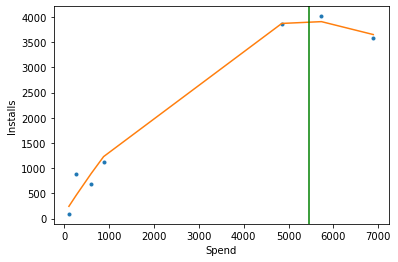

August TH


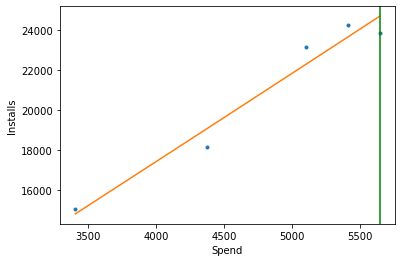

August TW


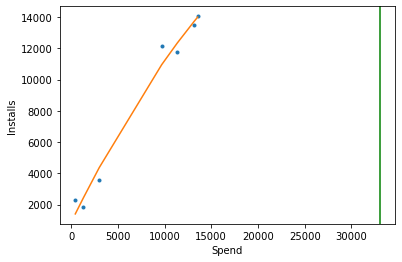

August UA


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



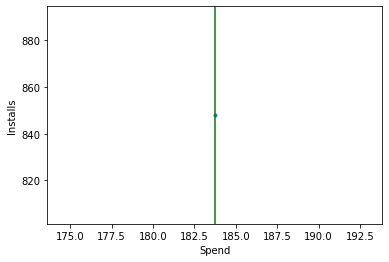

August US


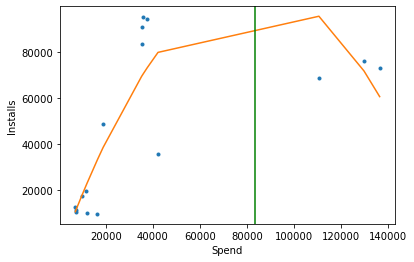

August VN


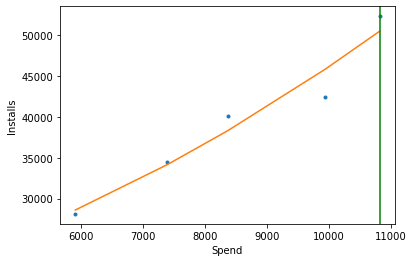

August ZA


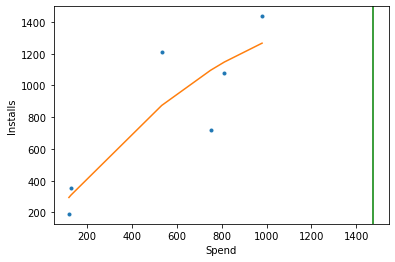

December AE


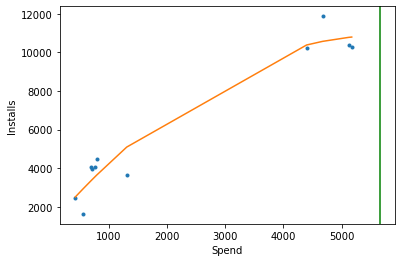

December AL


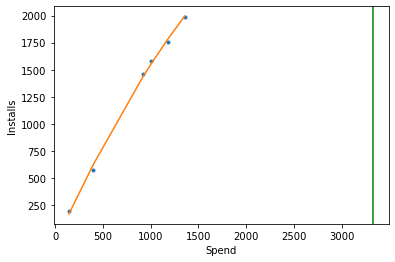

December AR


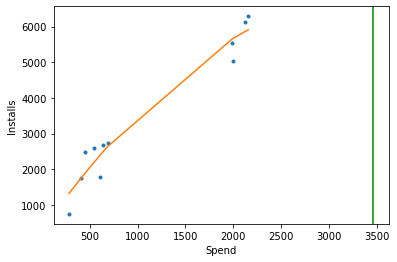

December AT


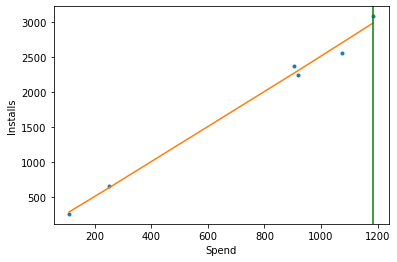

December AU


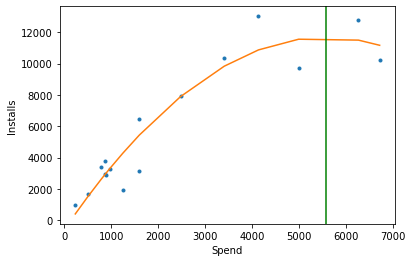

December BE


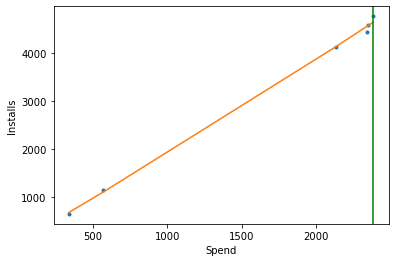

December CA


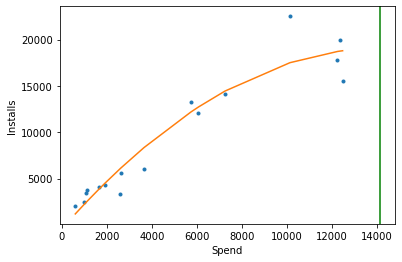

December CH


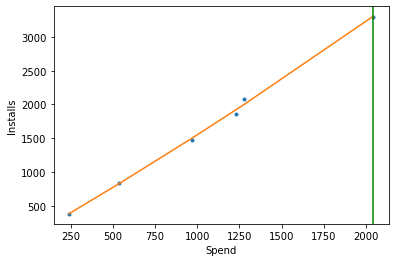

December CL


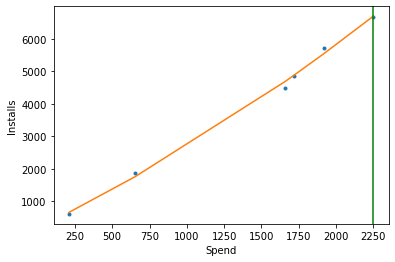

December CO


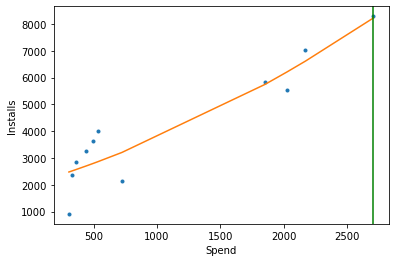

December CZ


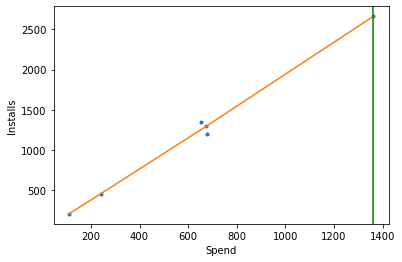

December DE


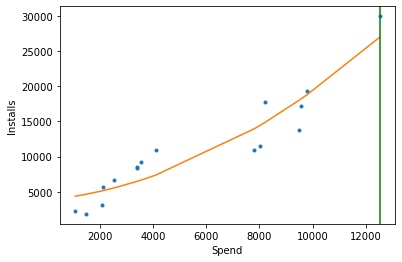

December DK


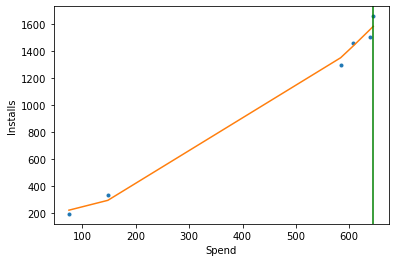

December EC


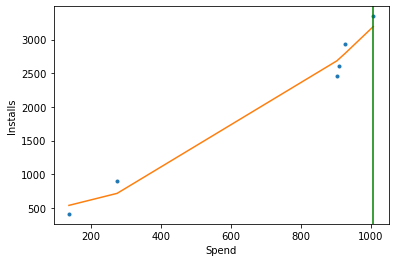

December EG


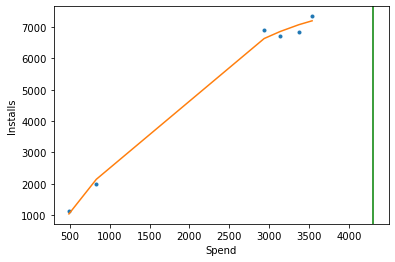

December ES


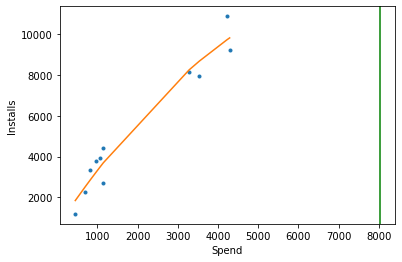

December FI


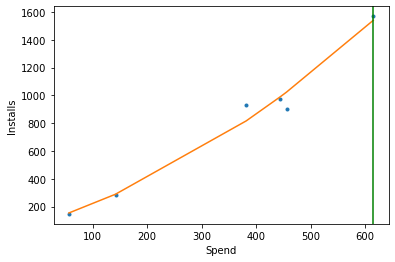

December FR


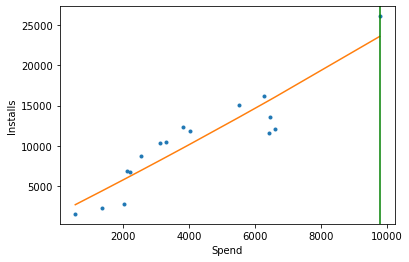

December GB


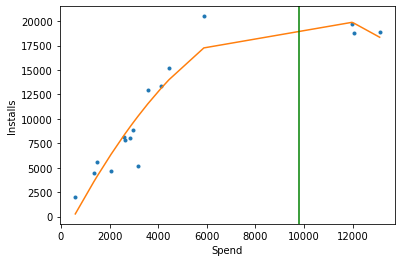

December GR


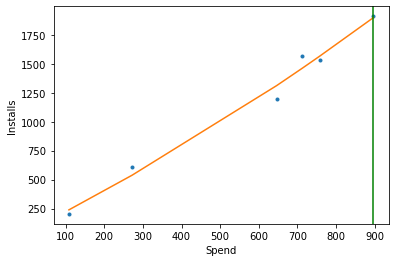

December HK


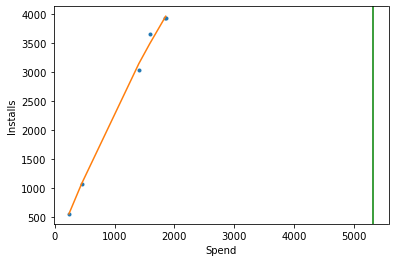

December HR


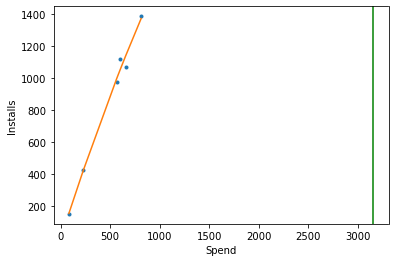

December HU


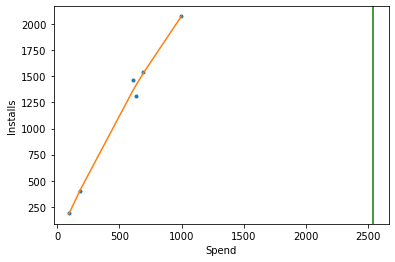

December ID


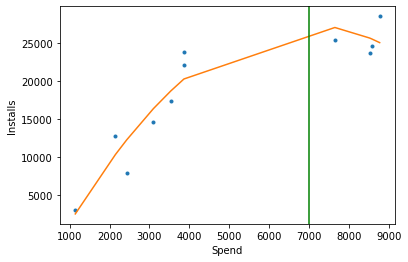

December IE


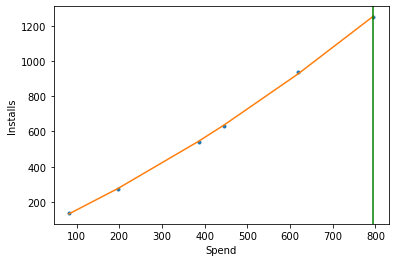

December IL


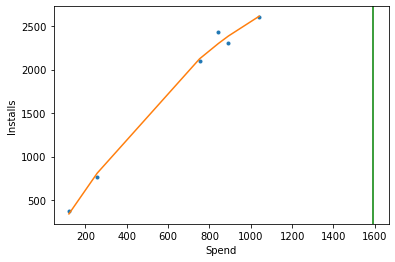

December IN


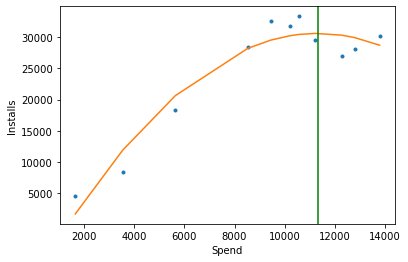

December IT


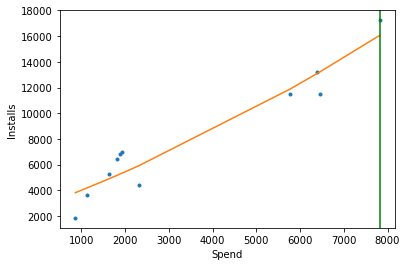

December JO


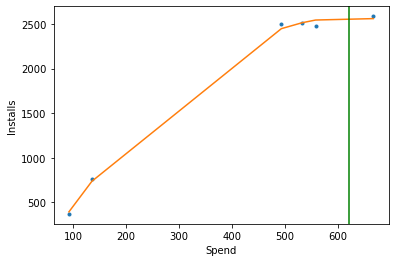

December JP


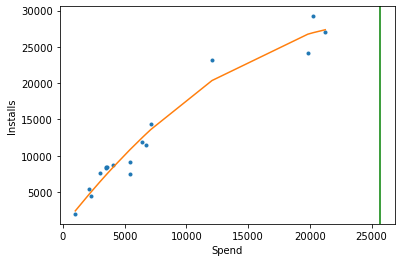

December KH


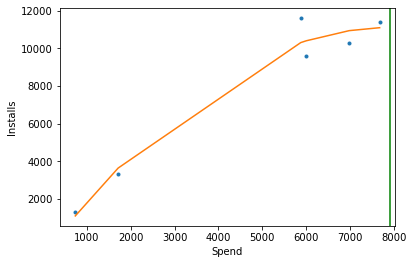

December KR


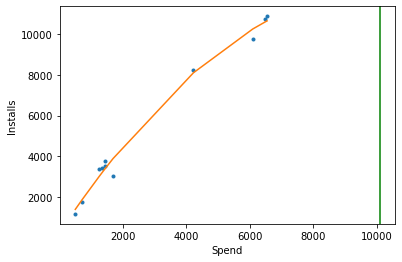

December KW


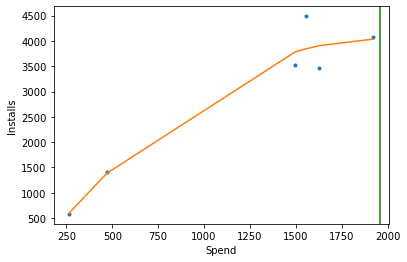

December KZ


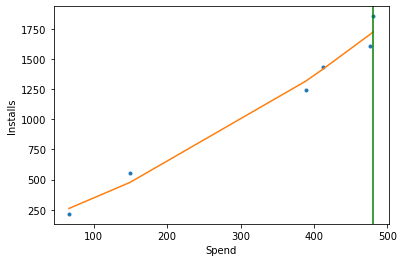

December LB


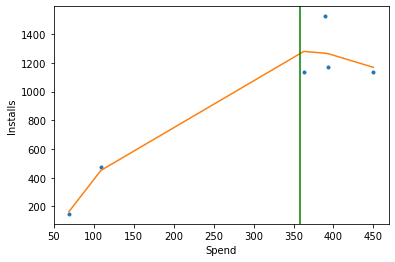

December MO


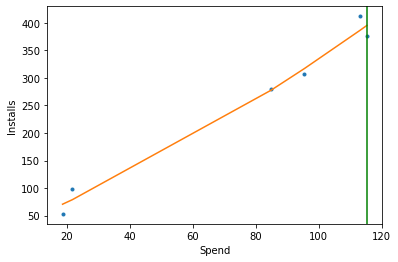

December MX


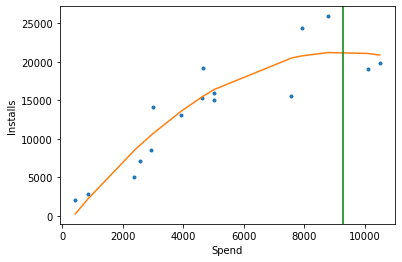

December MY


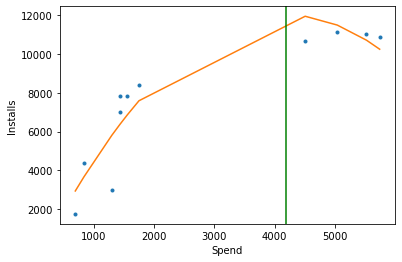

December NL


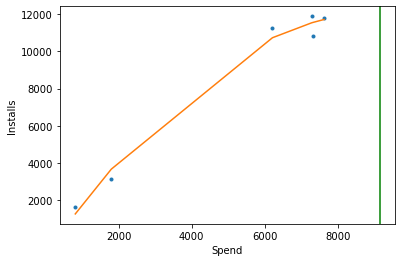

December NO


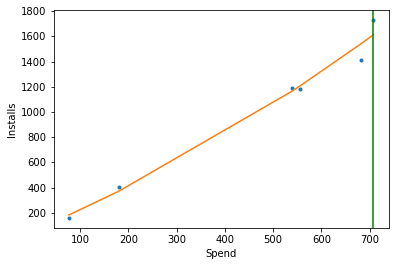

December NZ


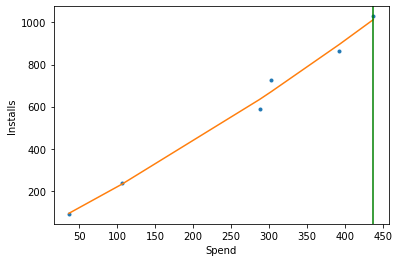

December OM


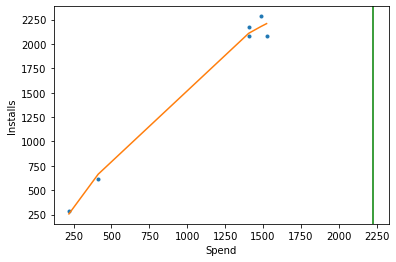

December PE


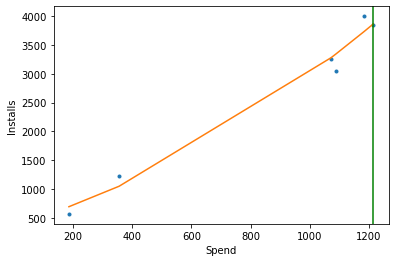

December PH


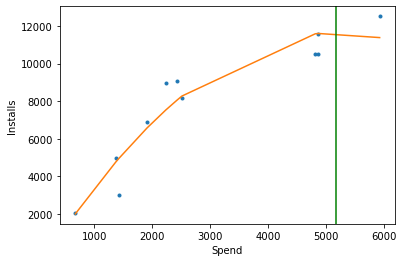

December PK


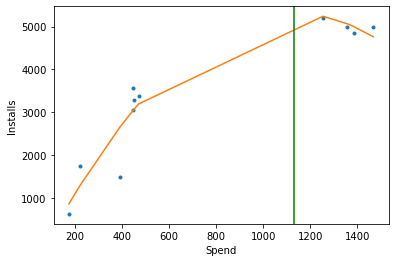

December PL


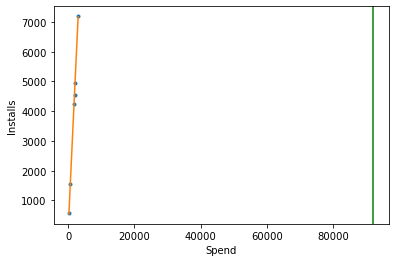

December PT


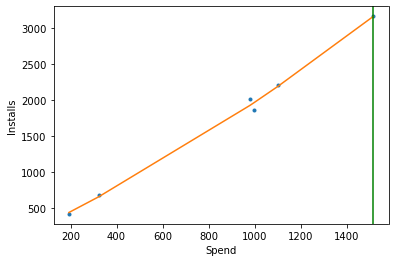

December QA


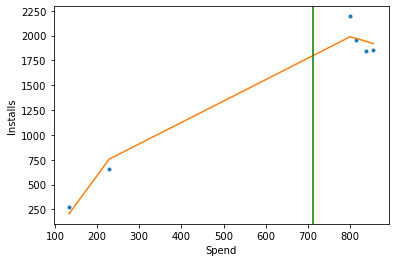

December RO


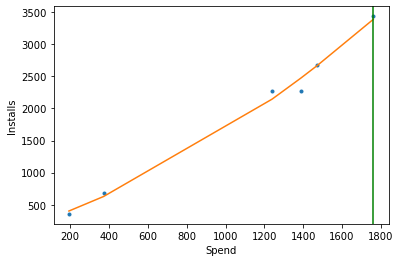

December RU


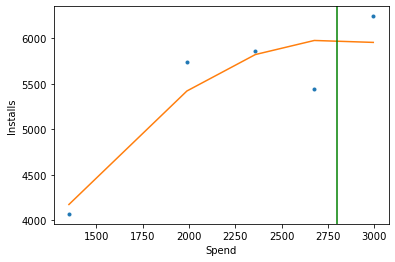

December SA


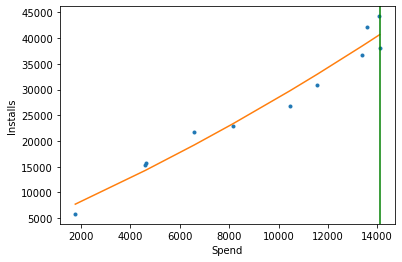

December SE


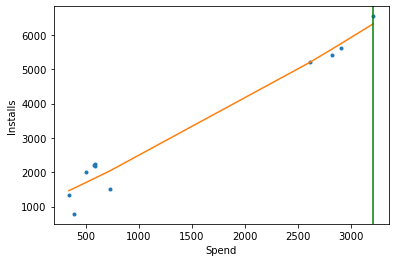

December SG


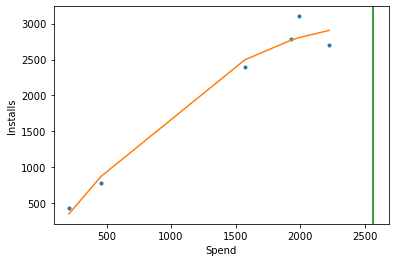

December TH


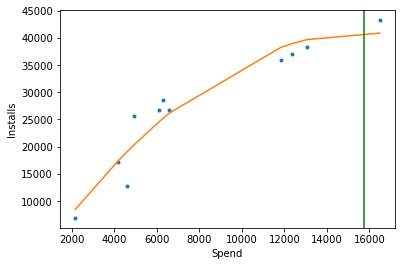

December TW


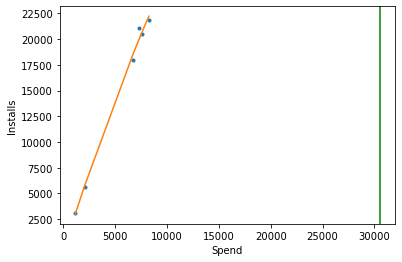

December UA


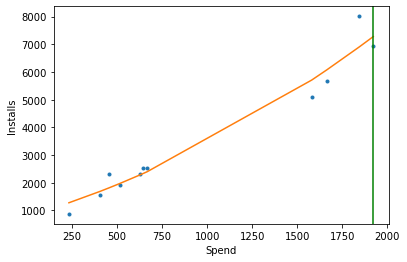

December US


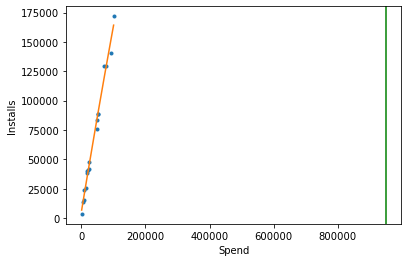

December VN


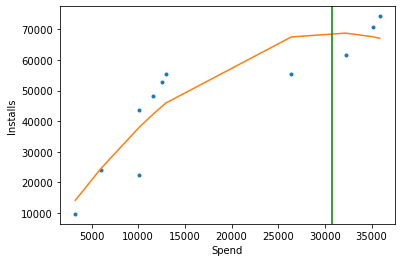

December ZA


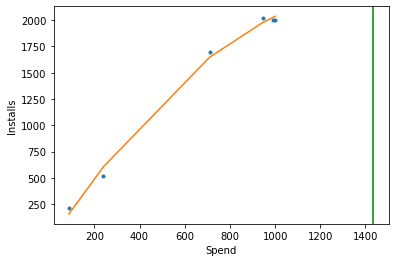

February AU


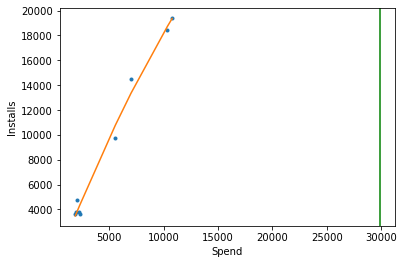

February CA


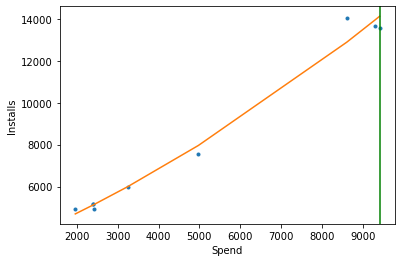

February DE


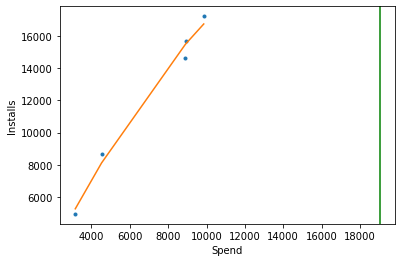

February FR


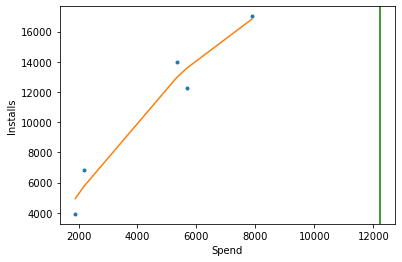

February GB


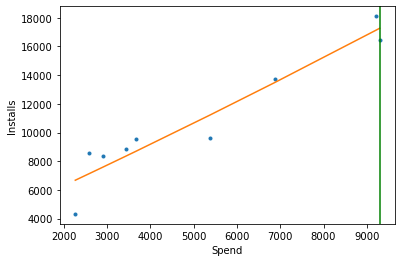

February IN


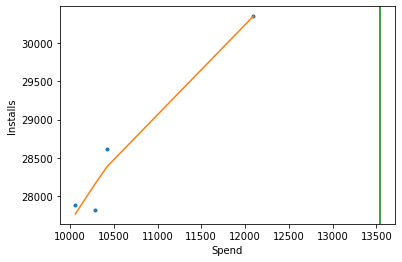

February JP


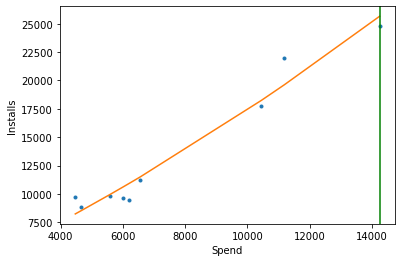

February MX


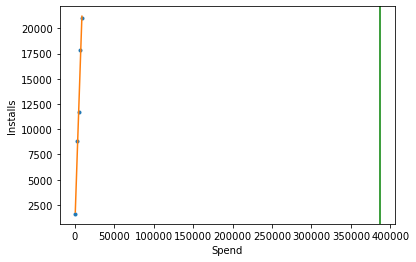

February TH


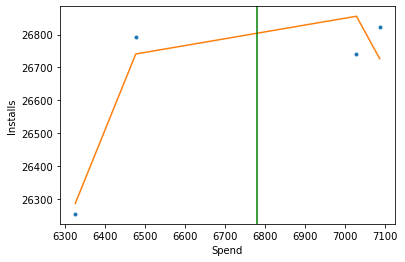

February US


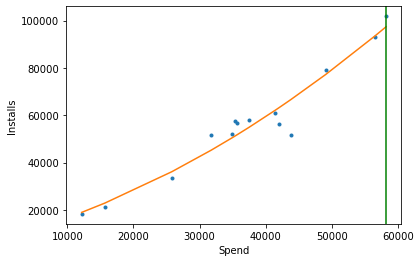

February VN


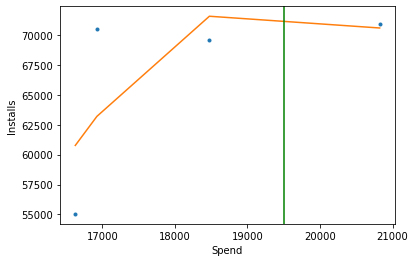

January AE


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



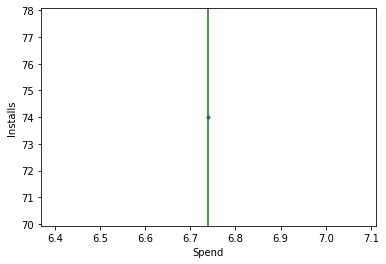

January AR


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



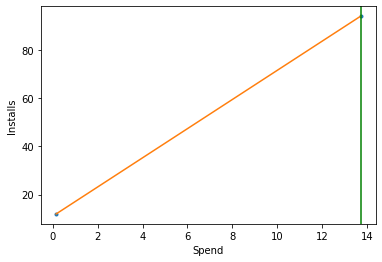

January AU


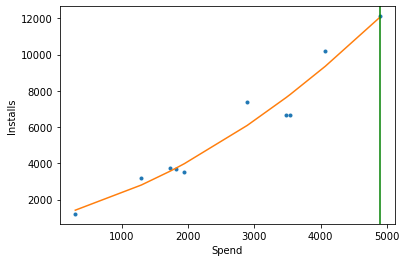

January CA


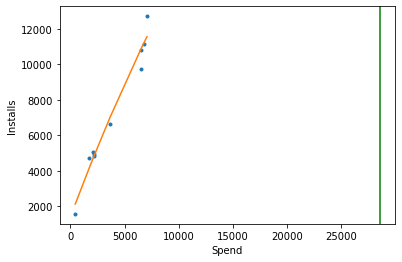

January CO


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



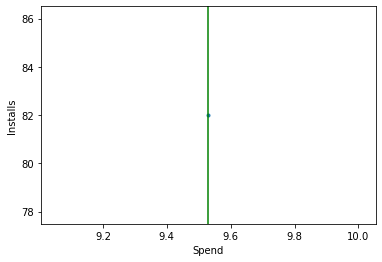

January DE


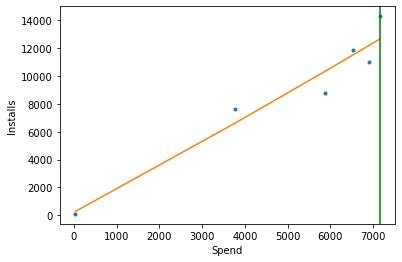

January ES


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



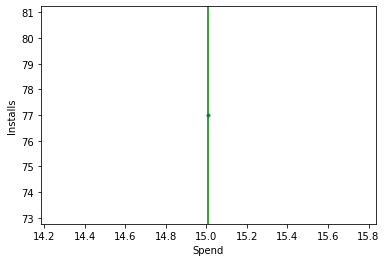

January FR


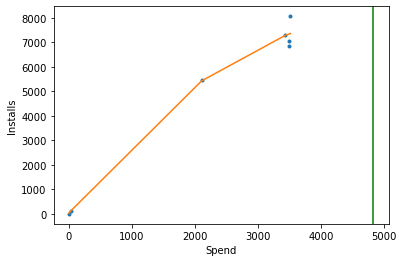

January GB


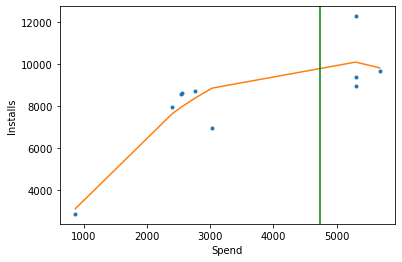

January ID


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



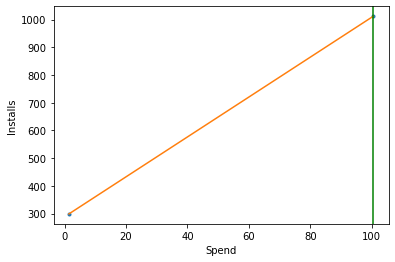

January IN


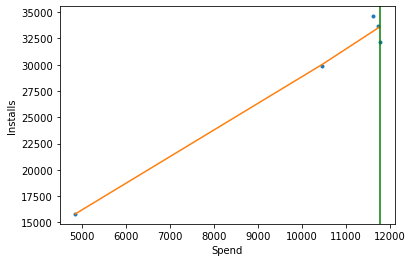

January IT


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



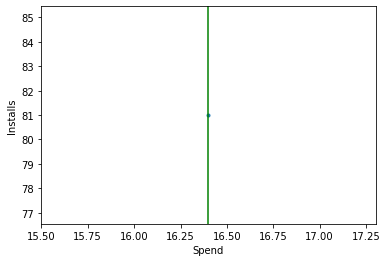

January JP


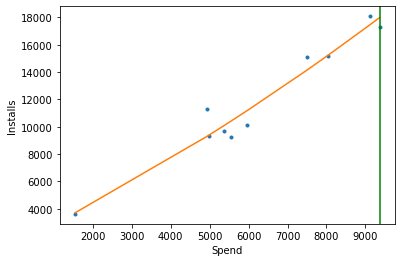

January KR


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



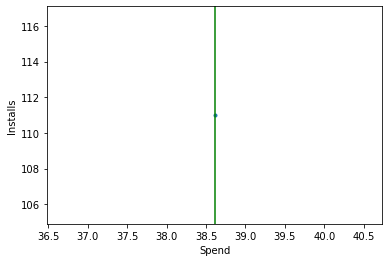

January MX


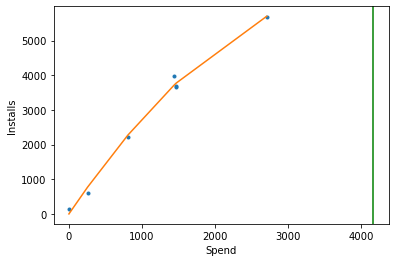

January MY


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



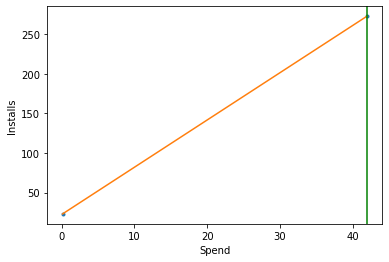

January PH


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



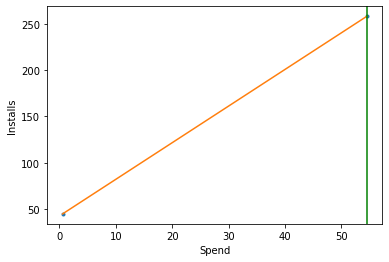

January PK


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



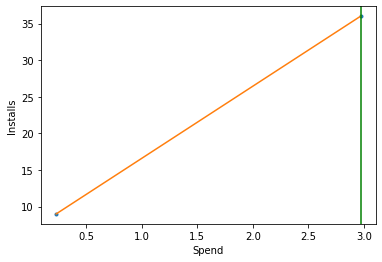

January RU


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



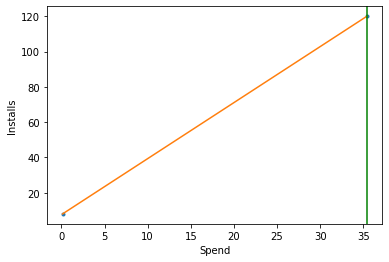

January SA


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



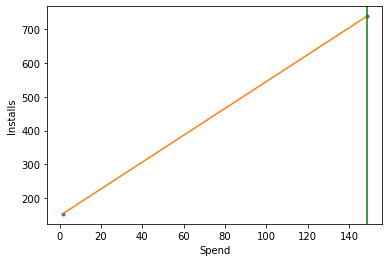

January SE


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



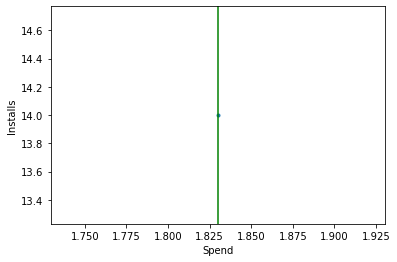

January TH


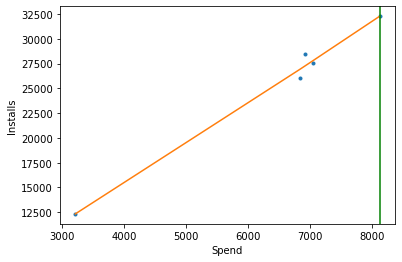

January UA


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



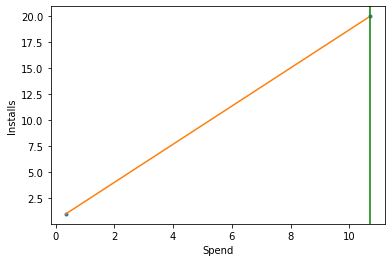

January US


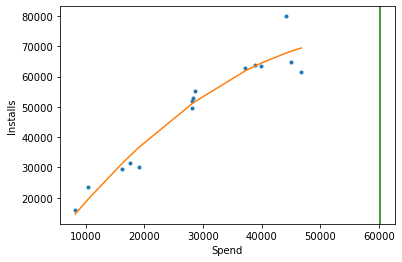

January VN


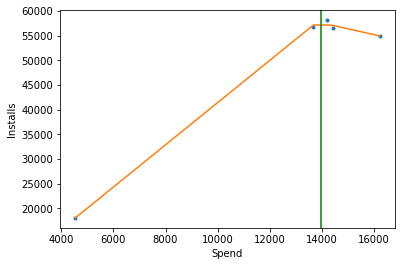

July AE


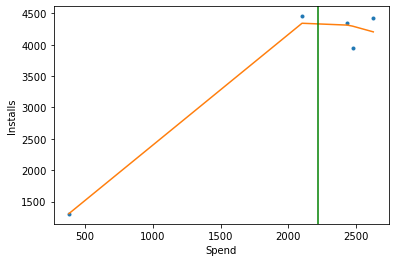

July AR


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



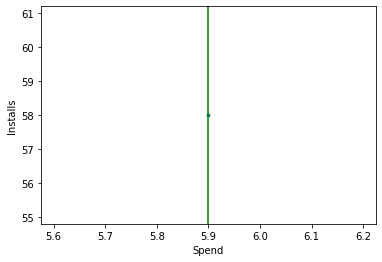

July AU


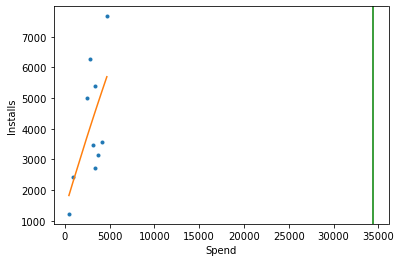

July CA


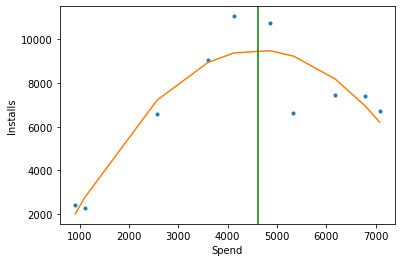

July CO


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



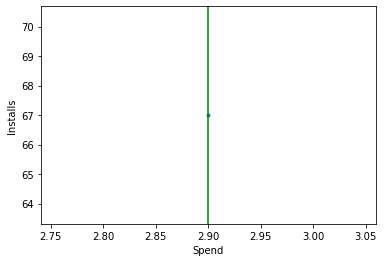

July DE


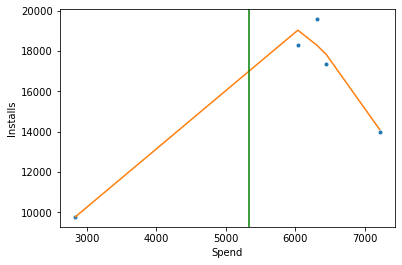

July DK


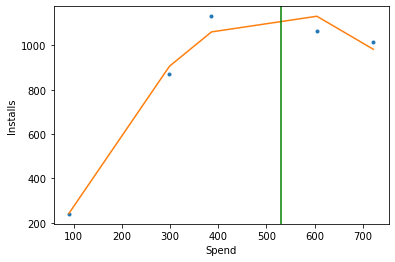

July ES


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



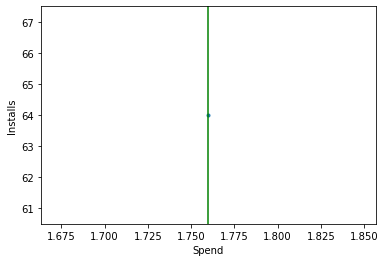

July FR


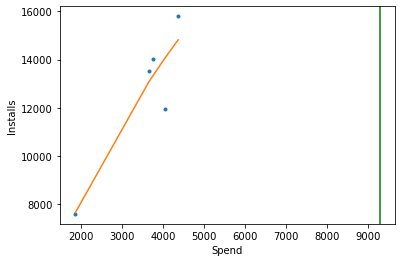

July GB


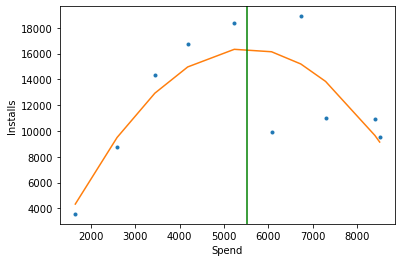

July ID


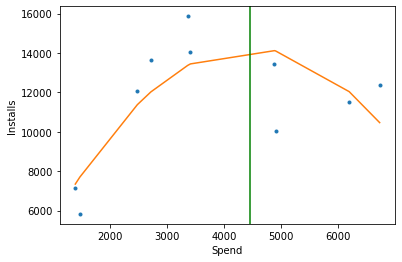

July IN


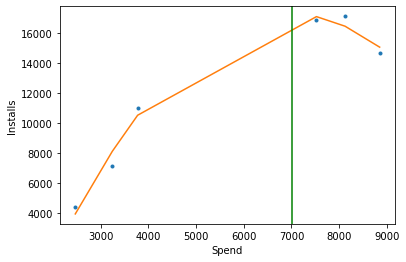

July IT


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



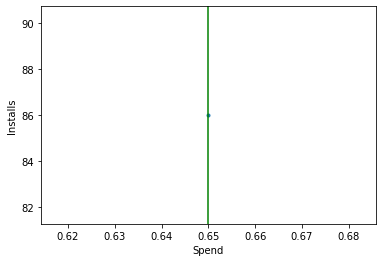

July JP


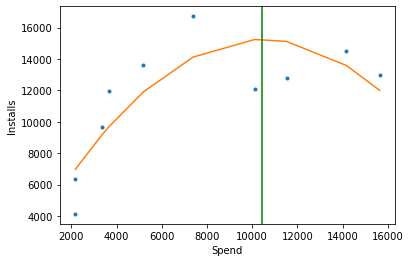

July MX


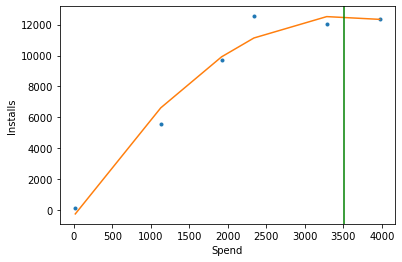

July MY


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



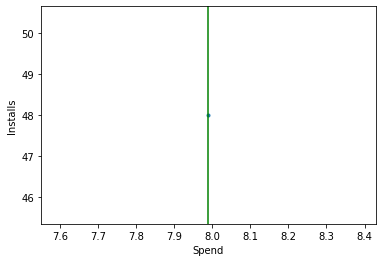

July NO


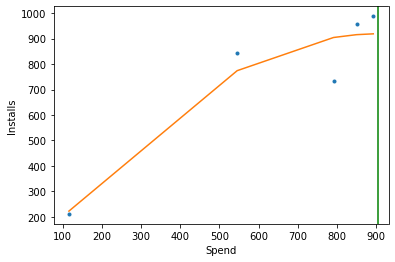

July PH


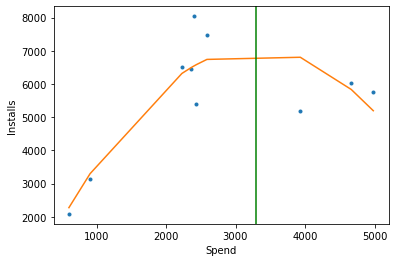

July PK


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



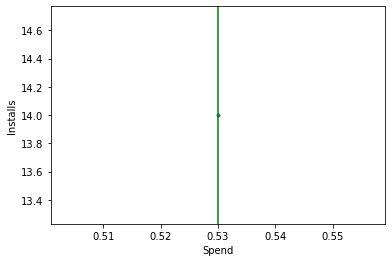

July RU


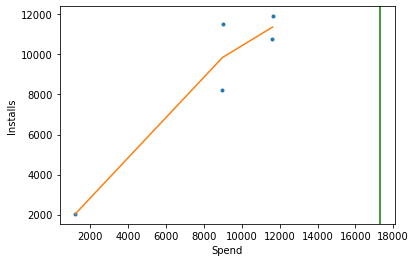

July SA


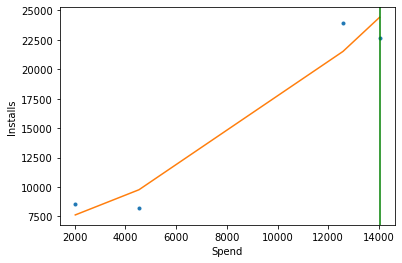

July SE


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



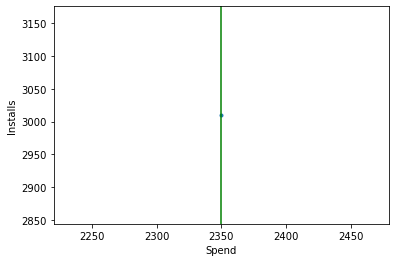

July TH


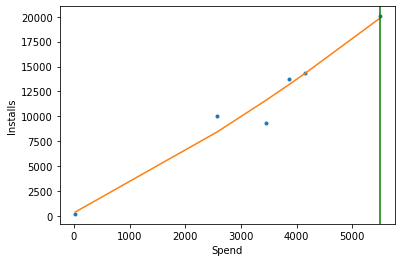

July TW


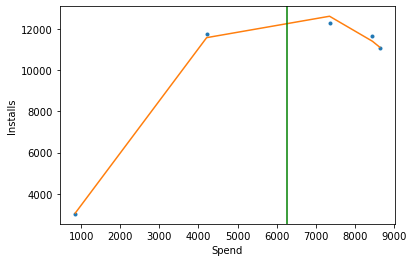

July US


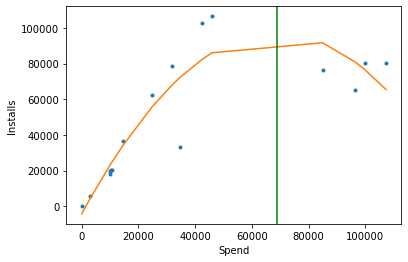

July VN


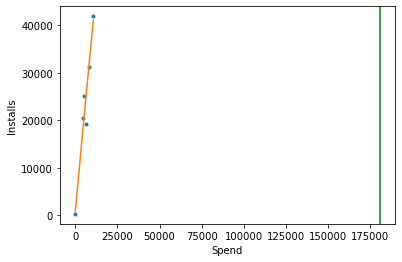

July ZA


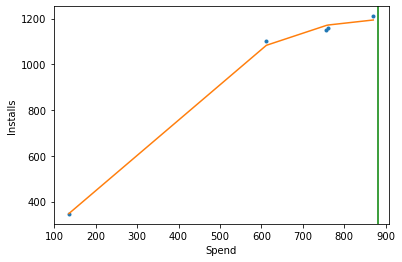

June AR


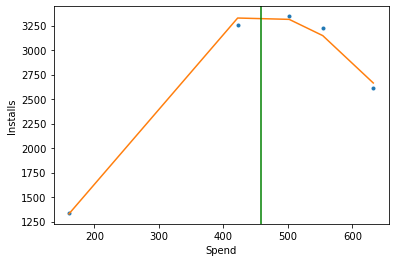

June AU


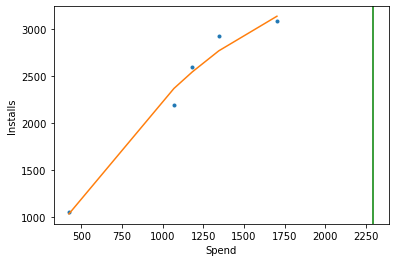

June CA


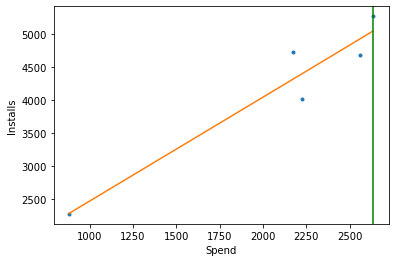

June CO


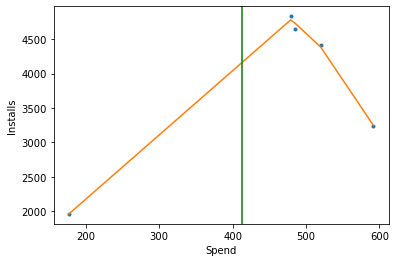

June ES


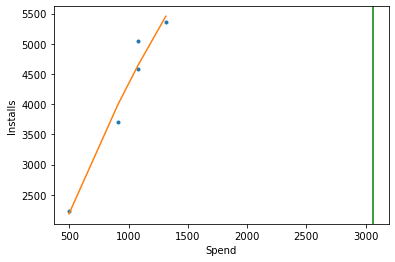

June GB


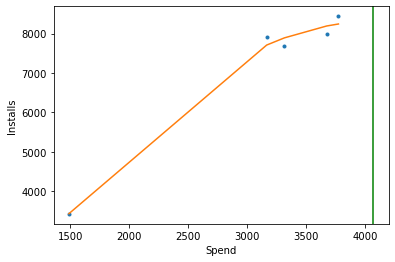

June ID


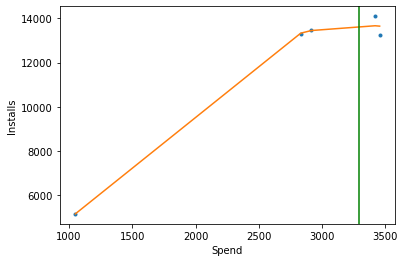

June IT


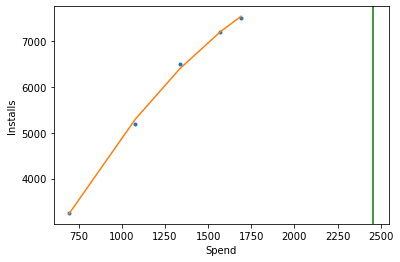

June JP


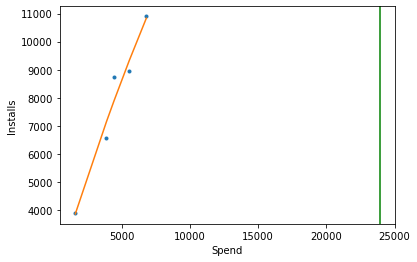

June MX


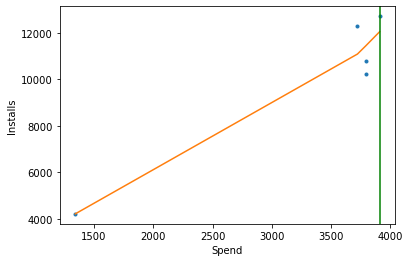

June MY


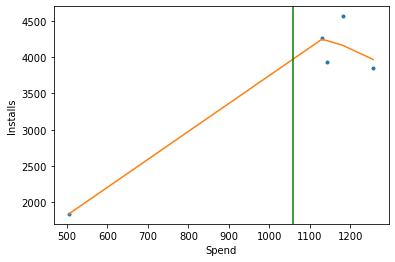

June PH


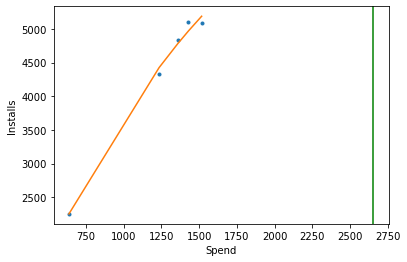

June PK


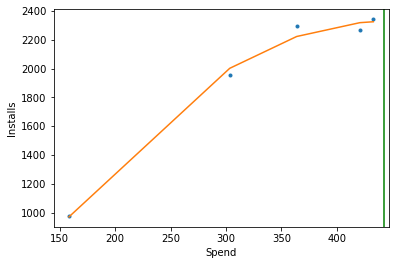

June SA


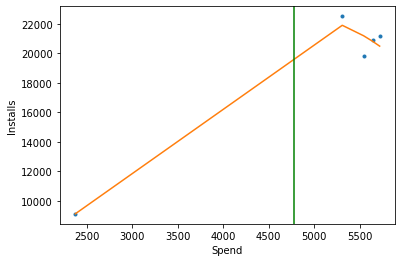

June TH


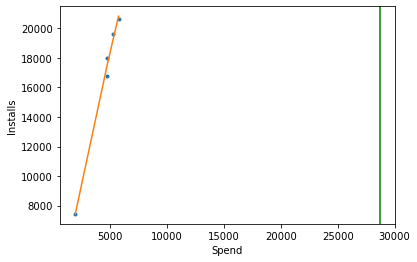

June US


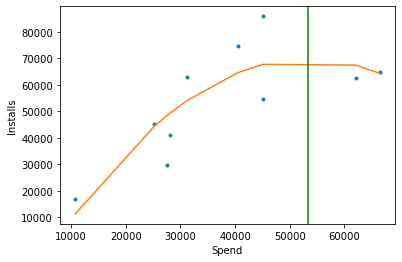

June VN


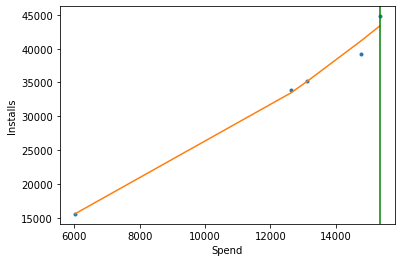

March AU


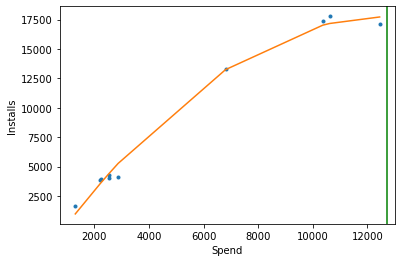

March CA


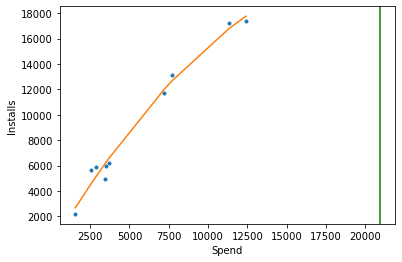

March DE


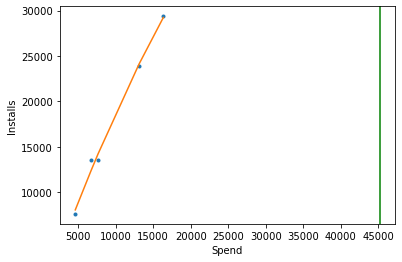

March FR


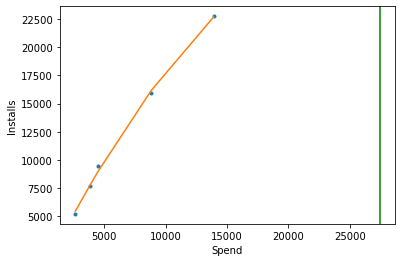

March GB


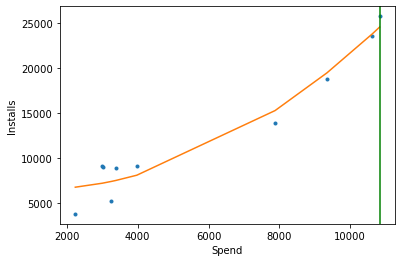

March ID


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



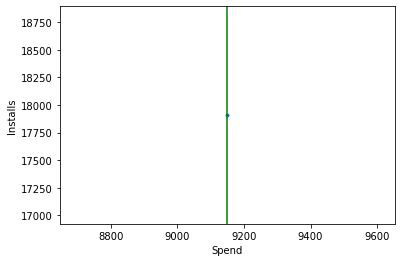

March IN


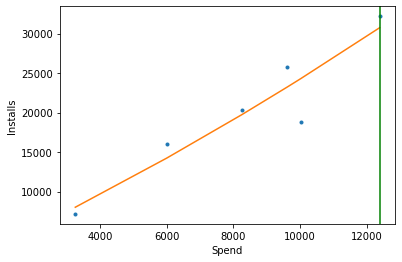

March JP


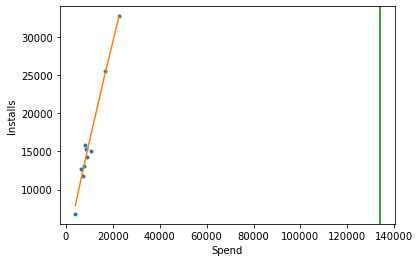

March MX


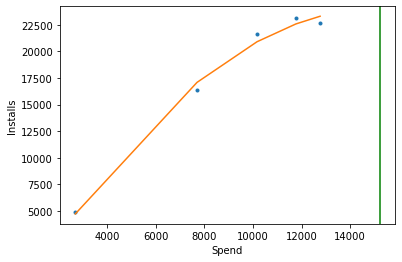

March PH


C:\Users\elda.pere\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: RankWarning:

Polyfit may be poorly conditioned



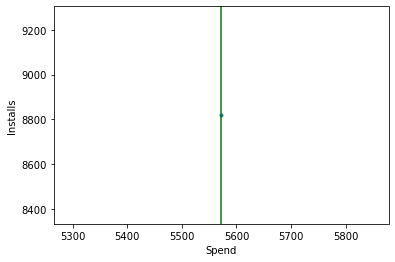

March TH


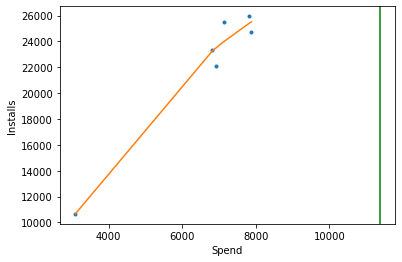

March US


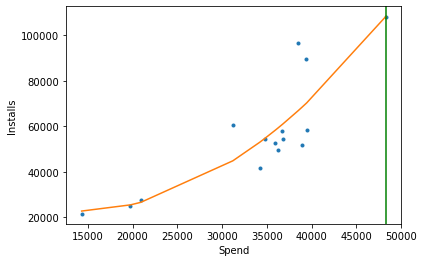

March VN


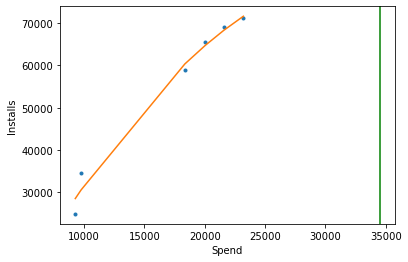

May AR


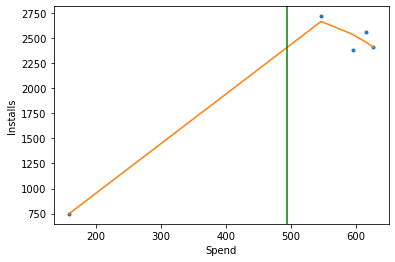

May AU


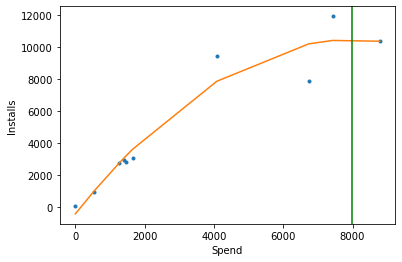

May CA


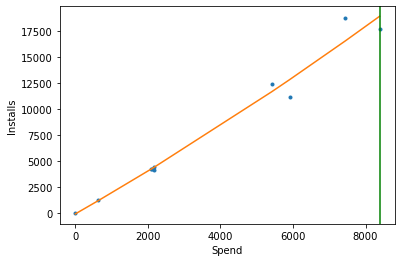

May CO


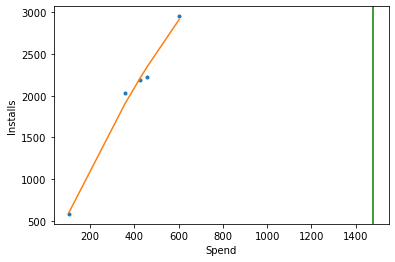

May DE


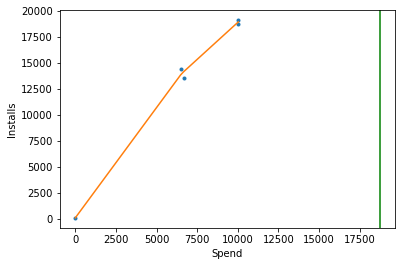

May ES


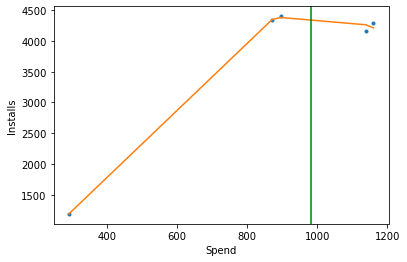

May FR


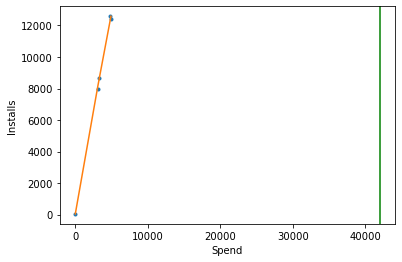

May GB


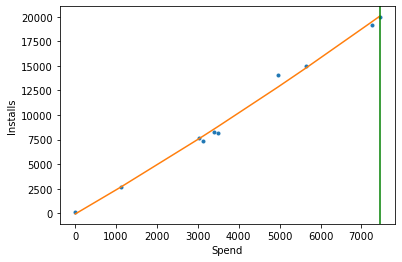

May ID


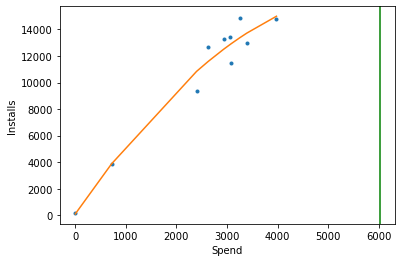

May IN


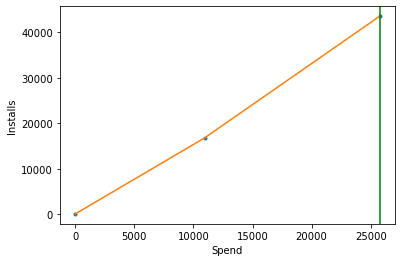

May IT


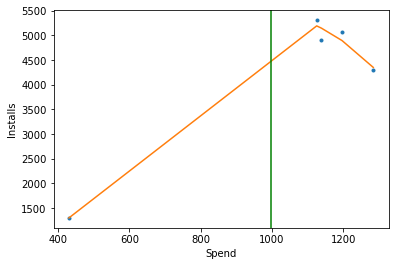

May JP


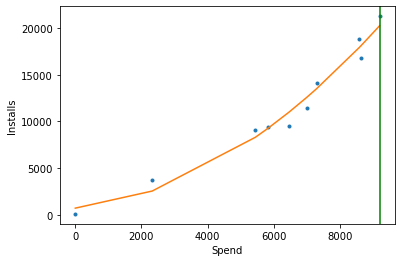

May MX


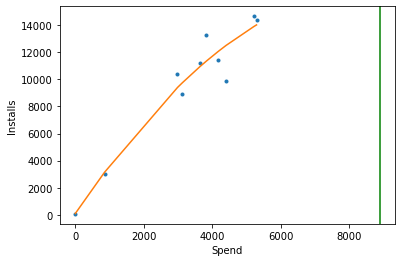

May MY


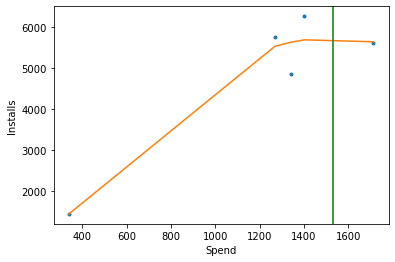

May PH


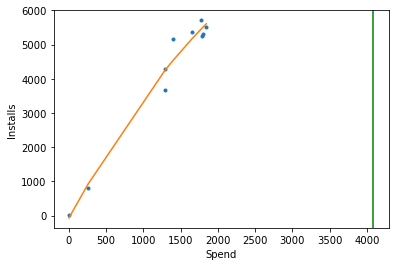

May PK


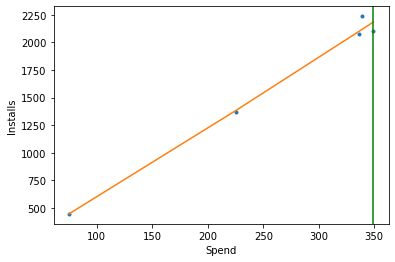

May SA


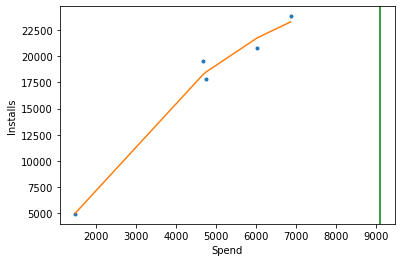

May TH


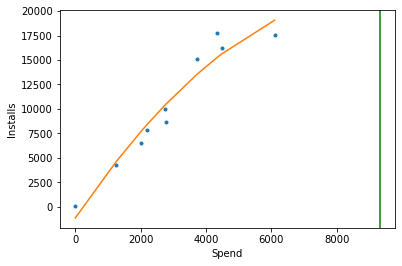

May US


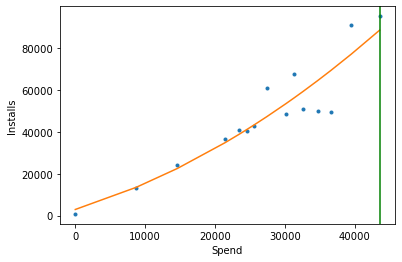

May VN


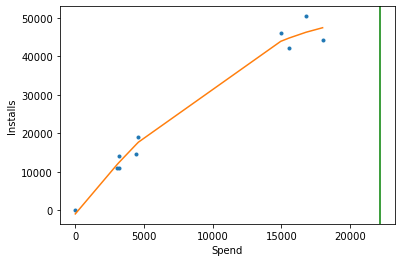

November AE


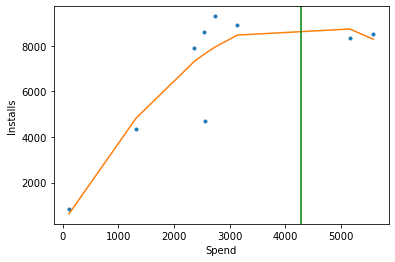

November AL


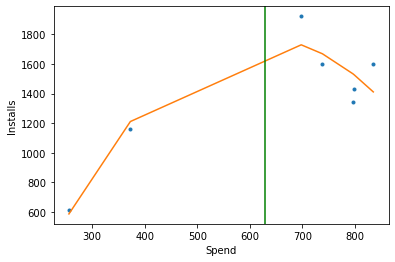

November AR


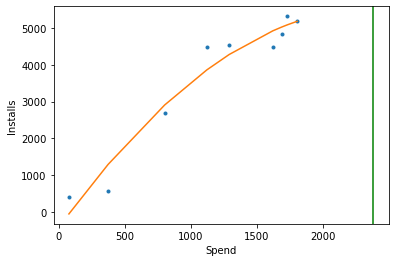

November AT


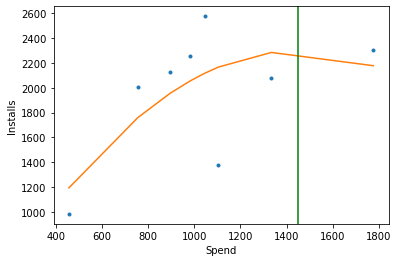

November AU


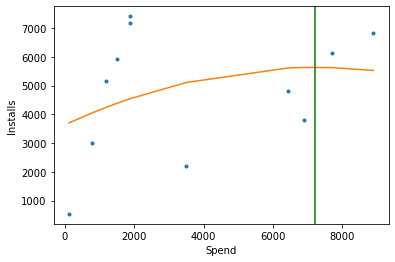

November BE


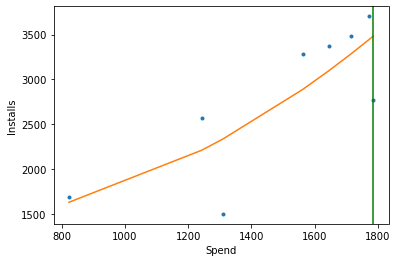

November CA


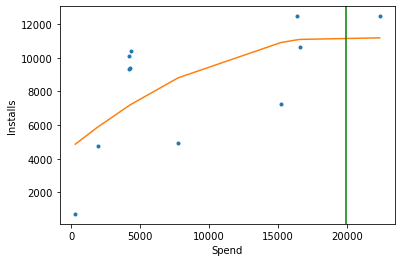

November CH


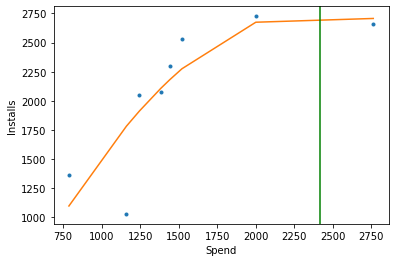

November CL


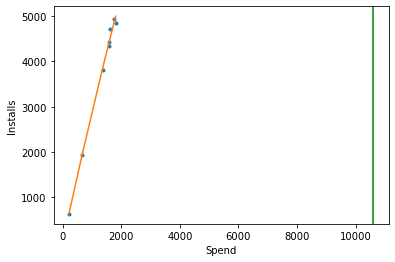

November CO


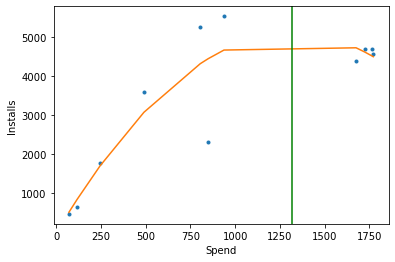

November CZ


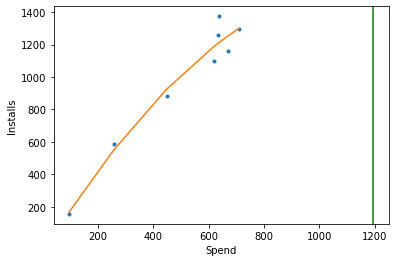

November DE


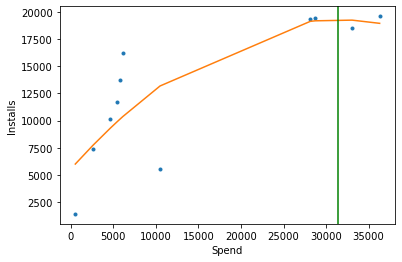

November DK


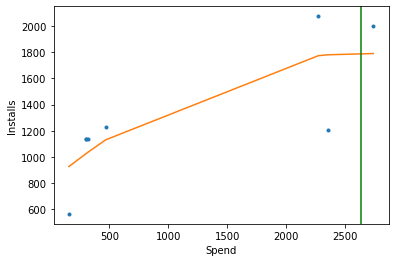

November EC


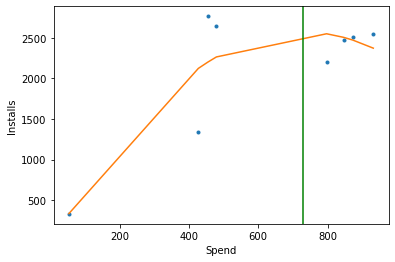

November EG


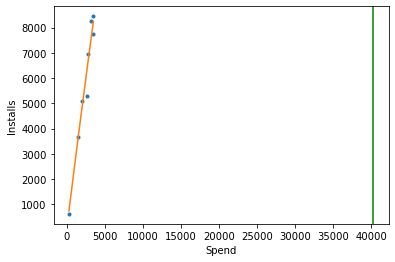

November ES


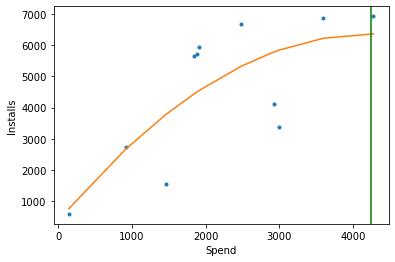

November FI


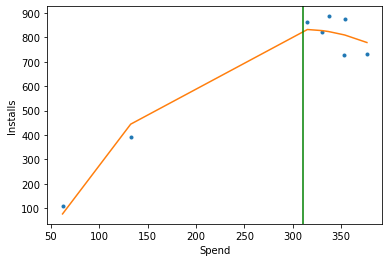

November FR


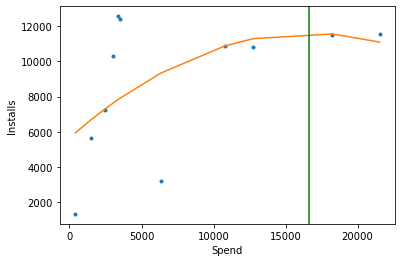

November GB


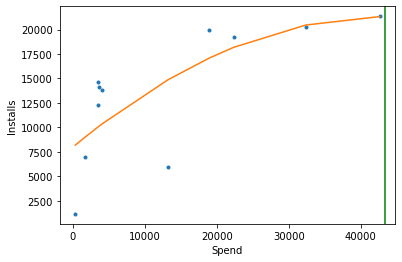

November GR


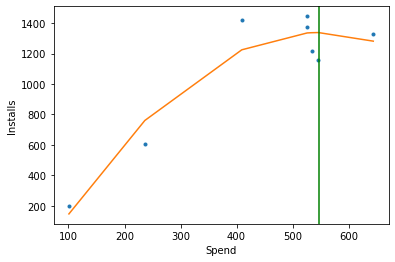

November HK


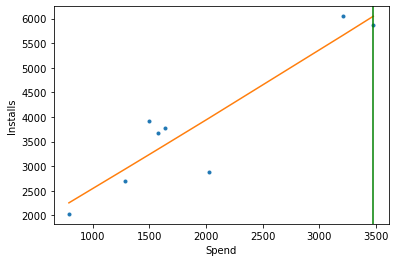

November HR


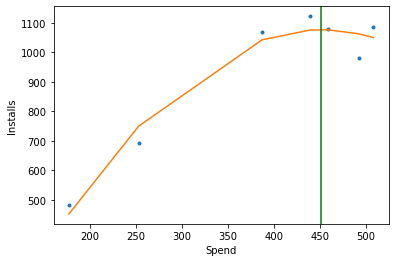

November HU


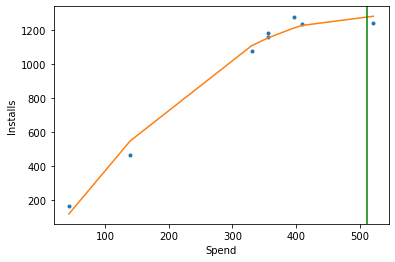

November ID


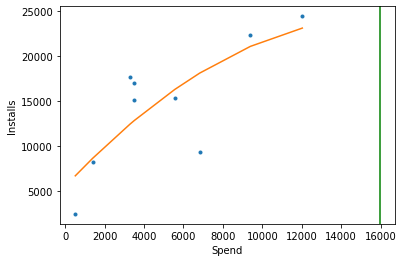

November IE


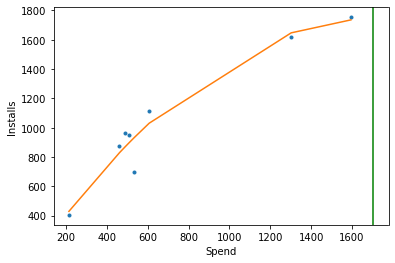

November IL


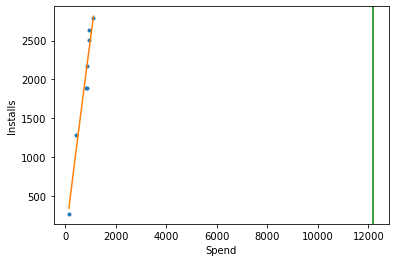

November IN


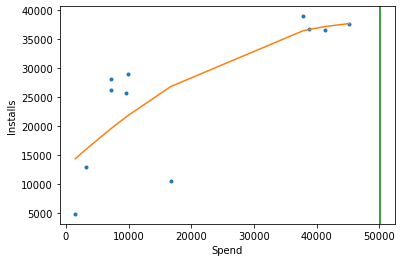

November IT


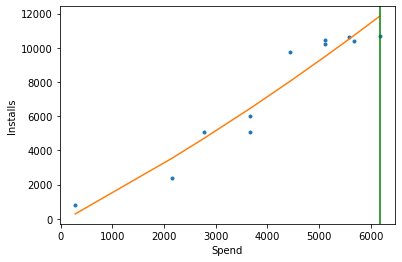

November JO


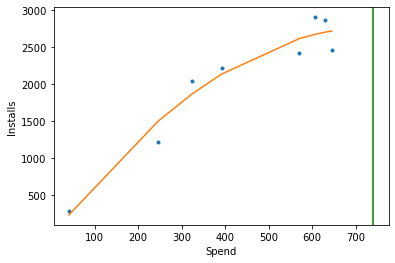

November JP


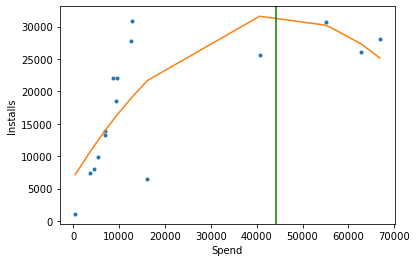

November KH


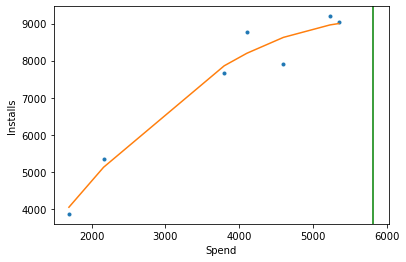

November KR


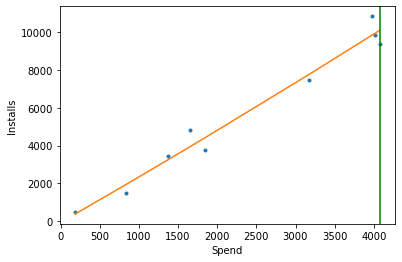

November KW


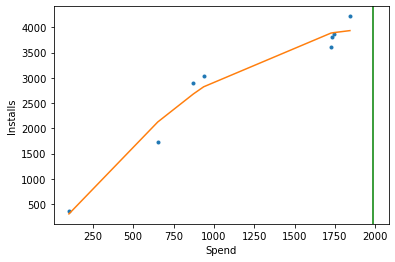

November KZ


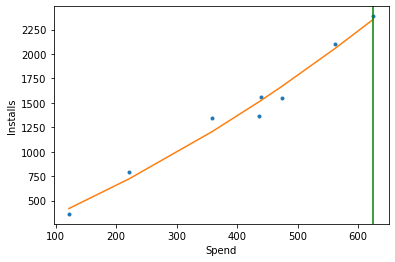

November LB


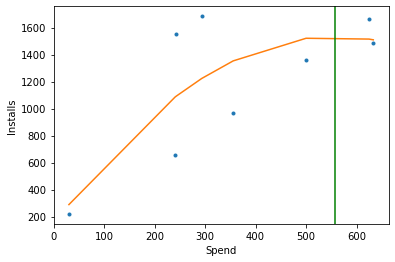

November MO


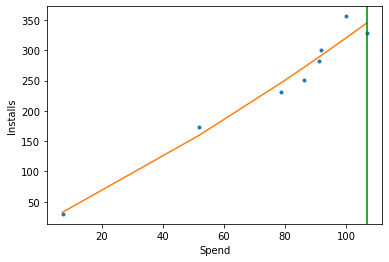

November MX


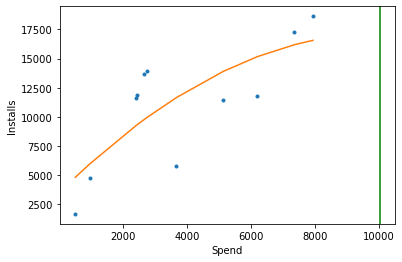

November MY


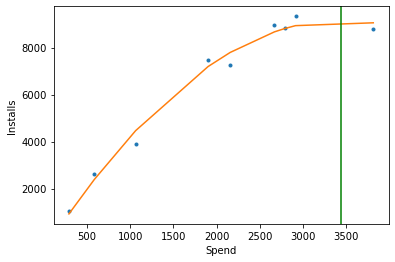

November NL


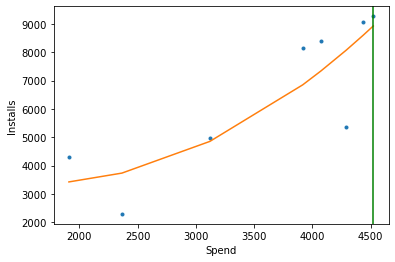

November NO


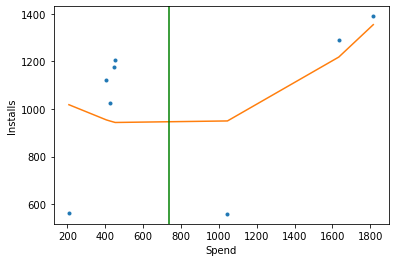

November NZ


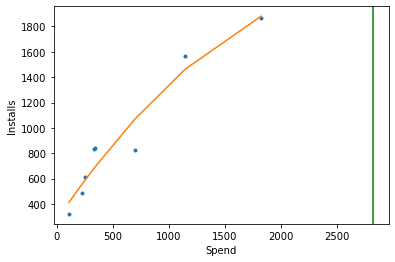

November OM


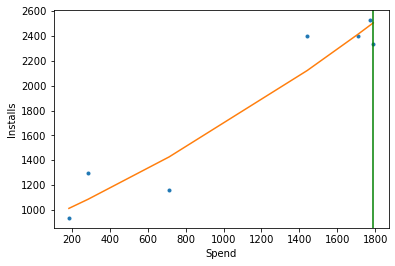

November PE


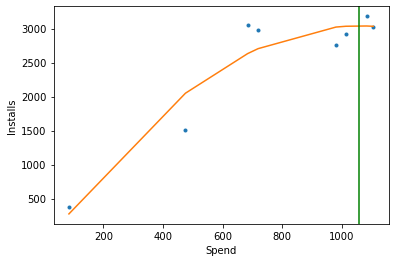

November PH


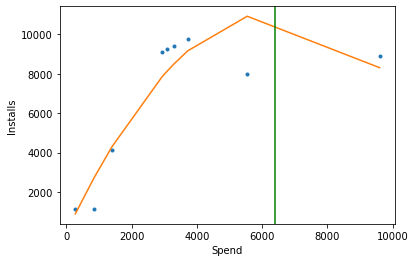

November PK


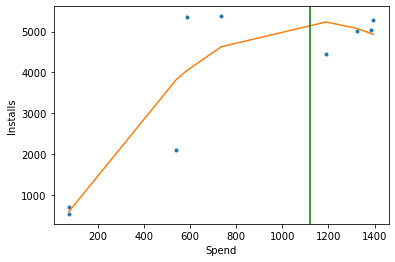

November PL


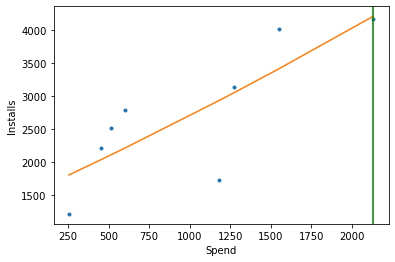

November PT


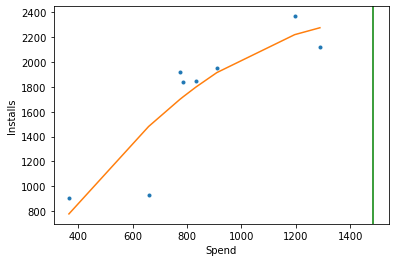

November QA


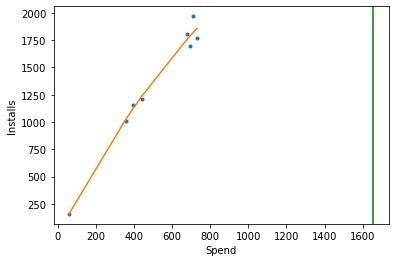

November RO


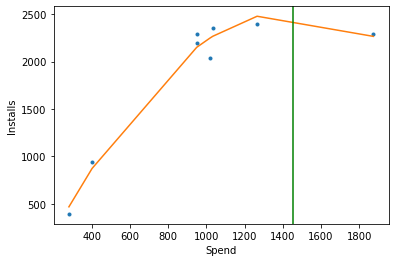

November RU


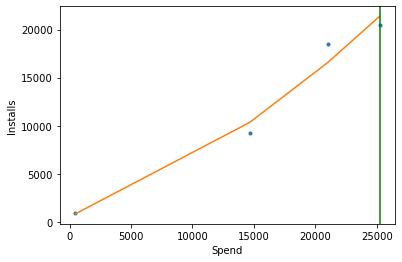

November SA


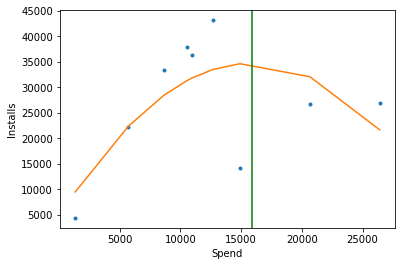

November SE


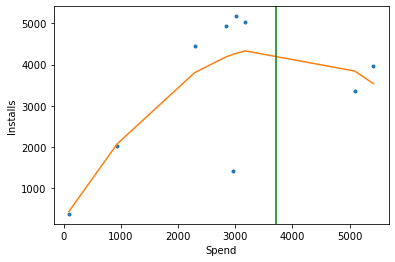

November SG


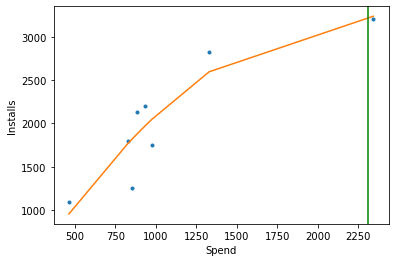

November TH


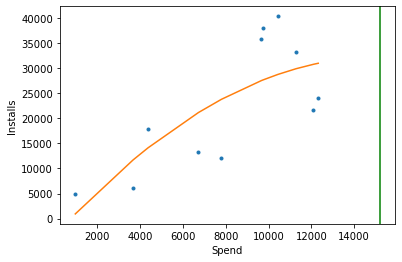

November TW


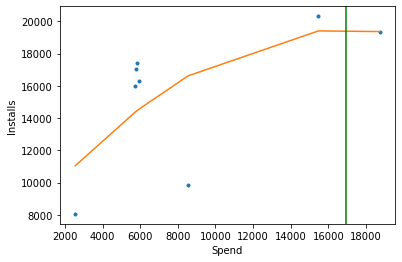

November UA


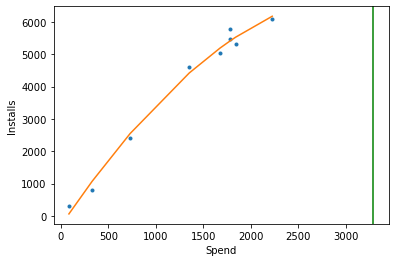

November US


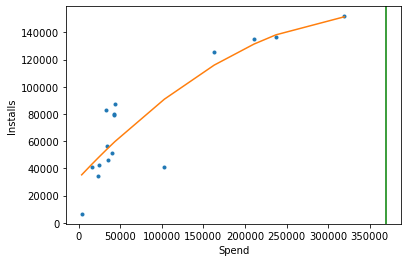

November VN


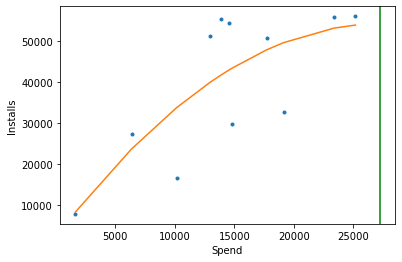

November ZA


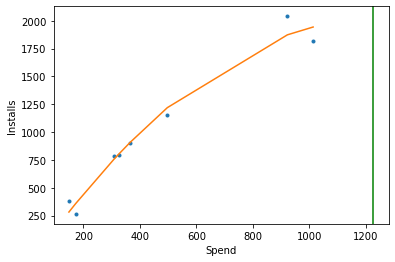

October AE


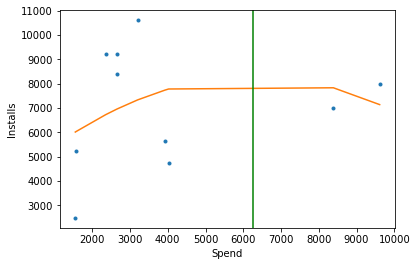

October AL


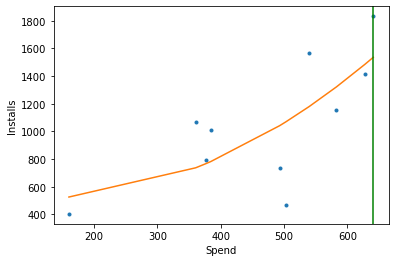

October AR


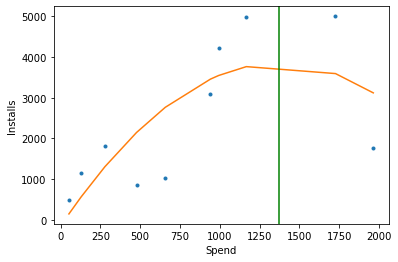

October AT


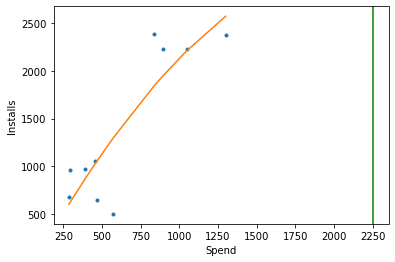

October AU


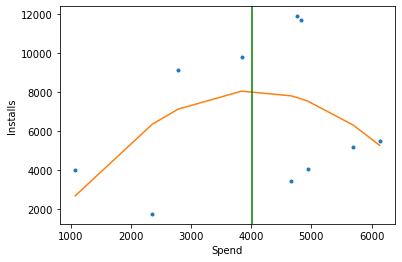

October BE


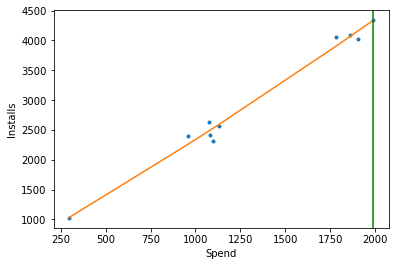

October CA


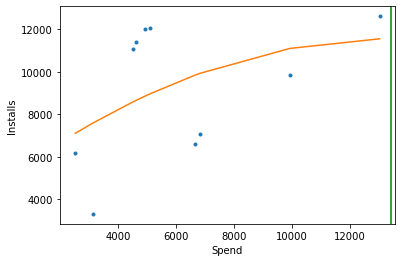

October CH


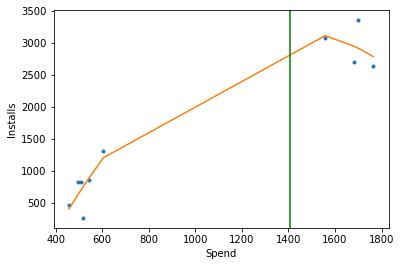

October CL


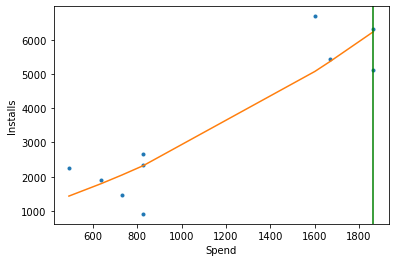

October CO


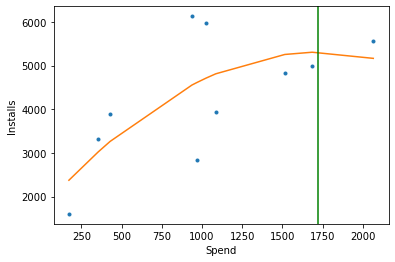

October CZ


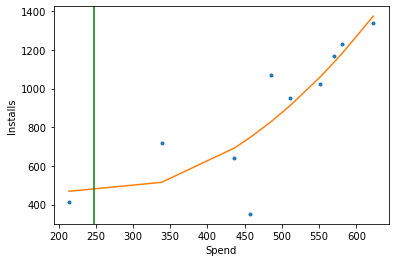

October DE


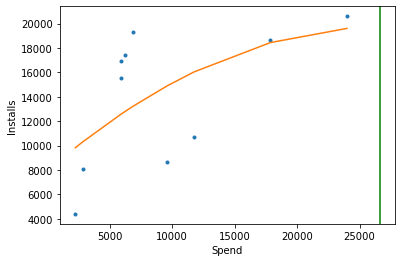

October DK


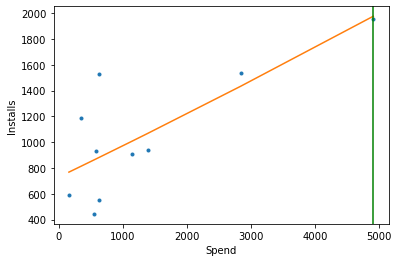

October EC


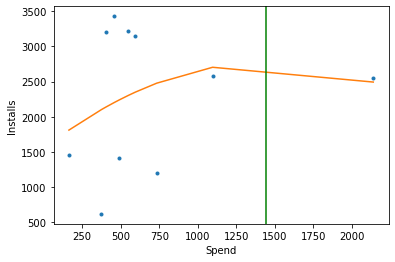

October EG


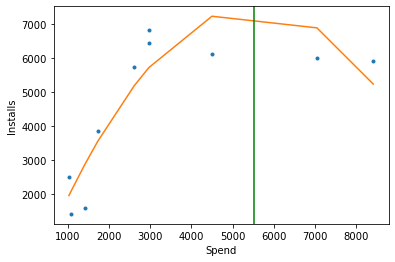

October ES


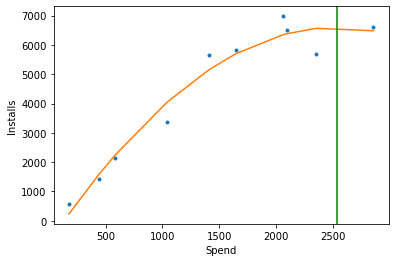

October FI


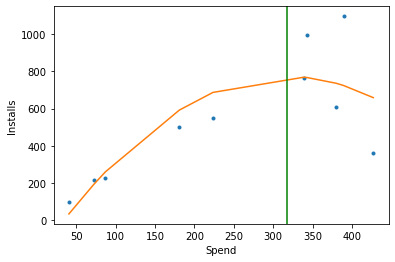

October FR


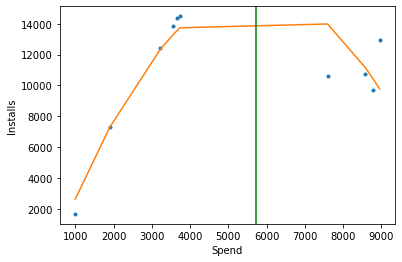

October GB


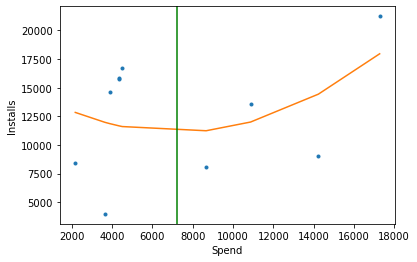

October GR


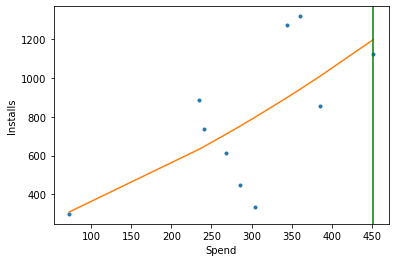

October HK


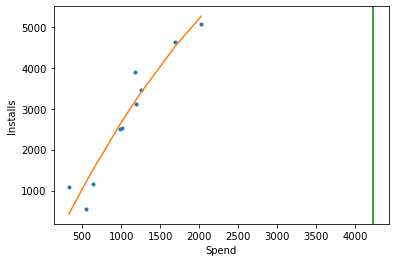

October HR


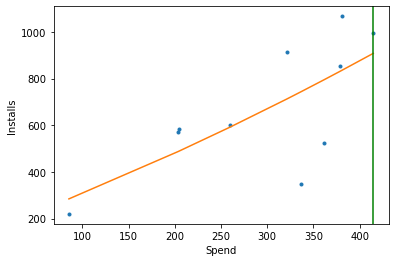

October HU


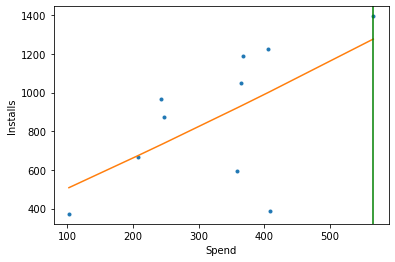

October ID


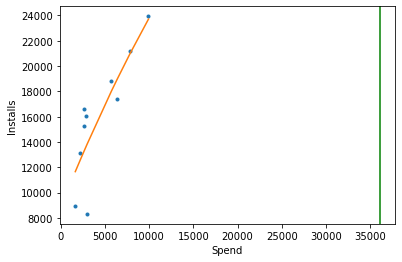

October IE


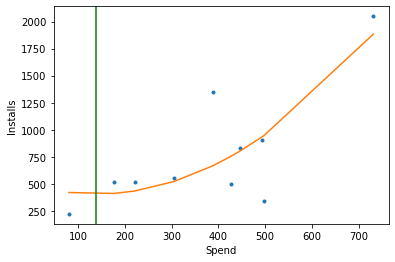

October IL


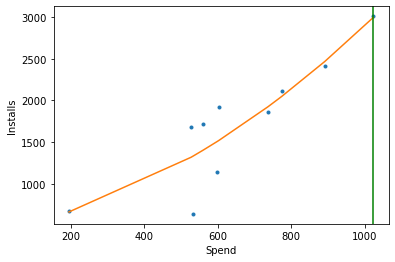

October IN


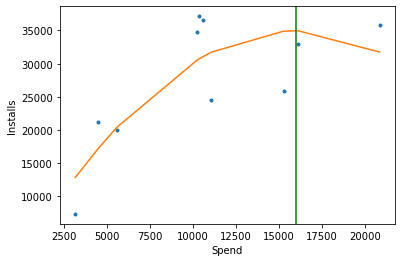

October IT


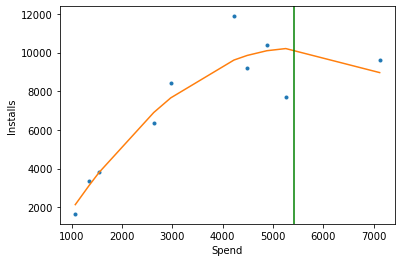

October JO


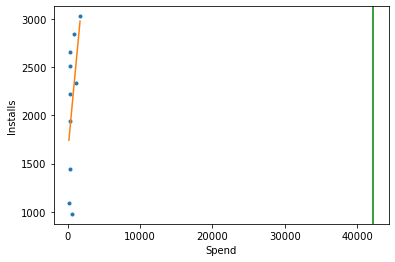

October JP


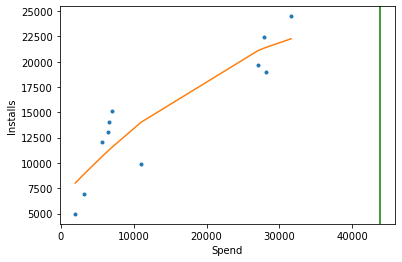

October KH


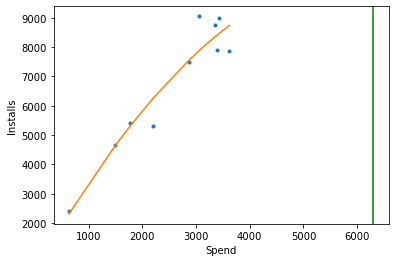

October KR


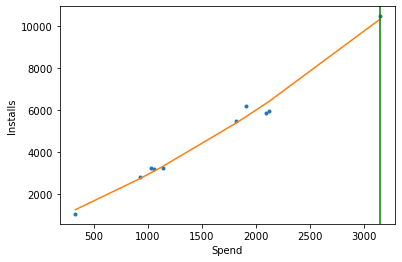

October KW


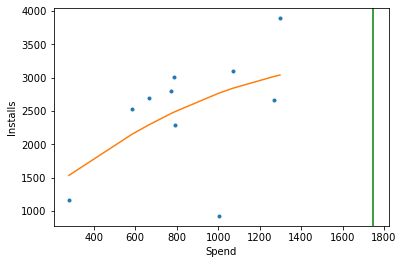

October KZ


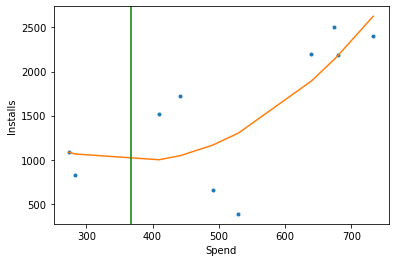

October LB


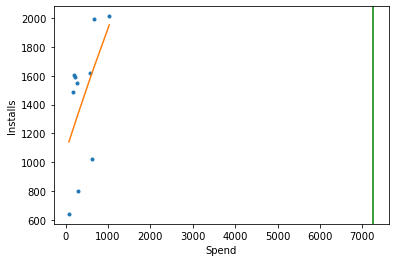

October MO


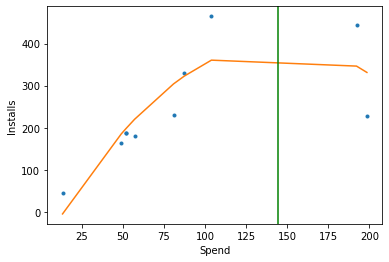

October MX


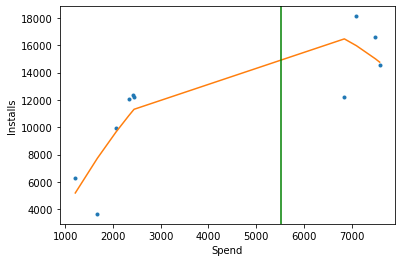

October MY


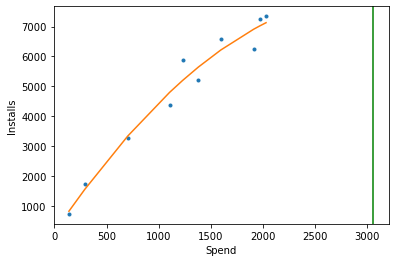

October NL


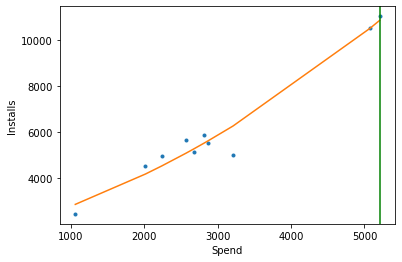

October NO


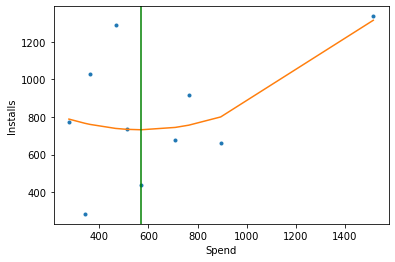

October NZ


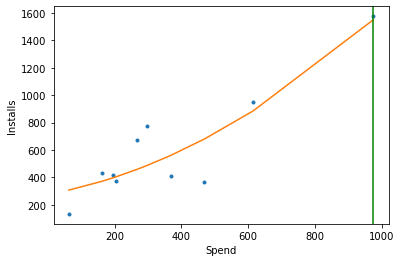

October OM


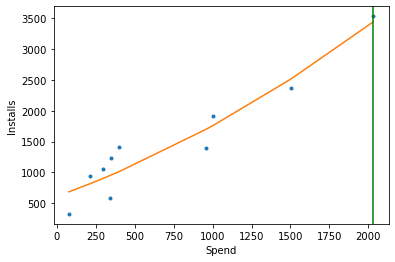

October PE


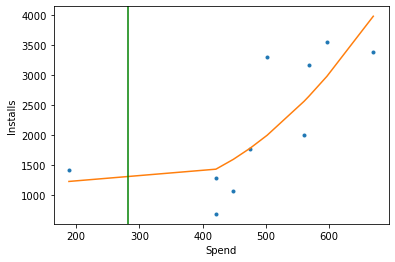

October PH


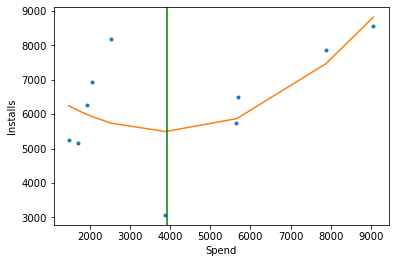

October PK


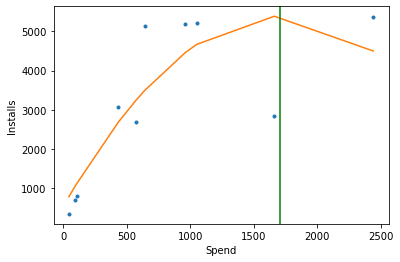

October PL


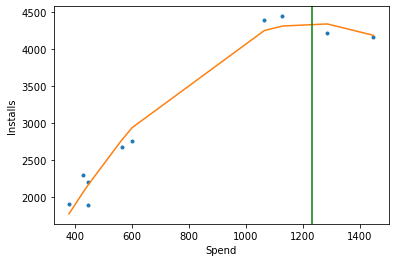

October PT


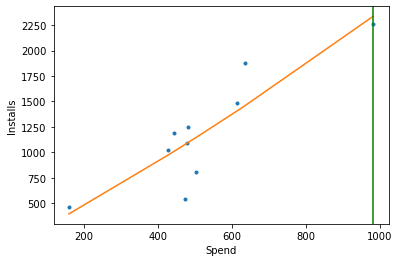

October QA


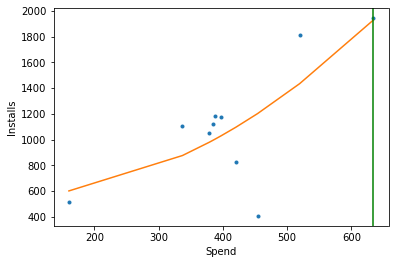

October RO


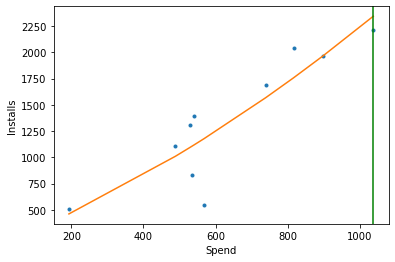

October RU


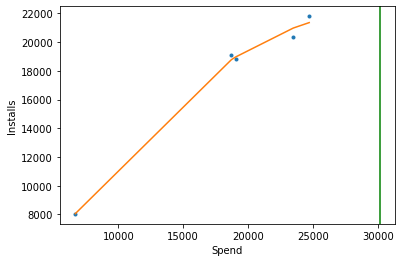

October SA


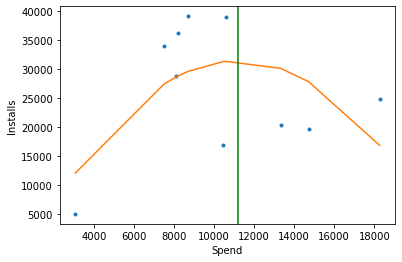

October SE


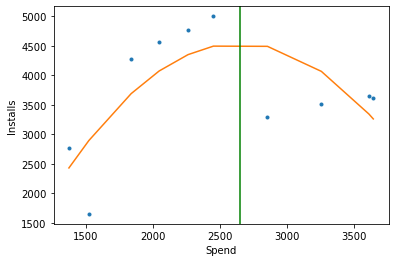

October SG


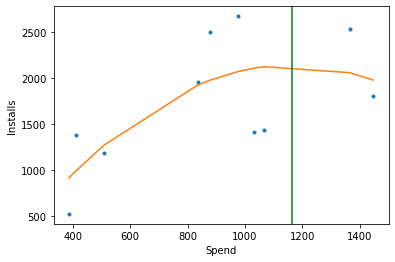

October TH


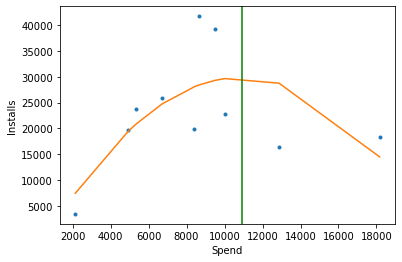

October TW


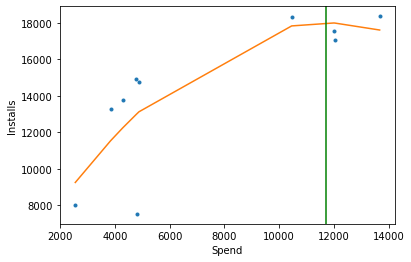

October UA


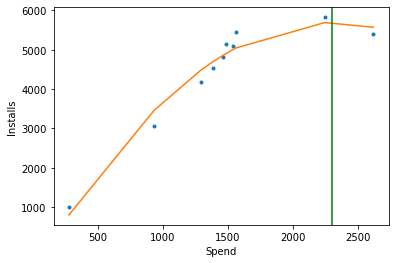

October US


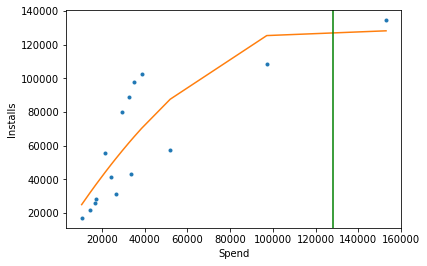

October VN


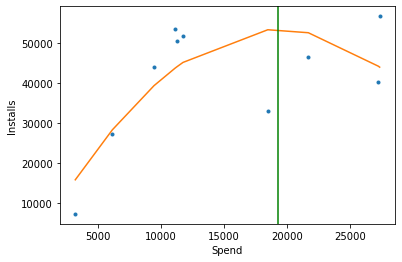

October ZA


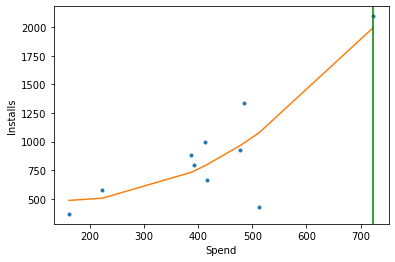

September AE


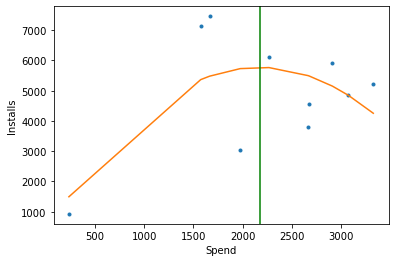

September AR


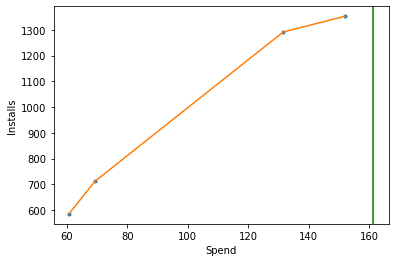

September AU


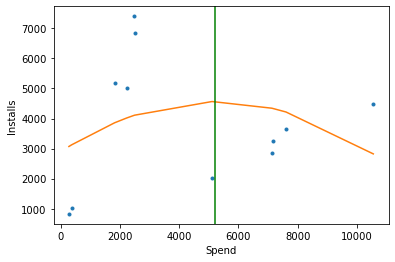

September BE


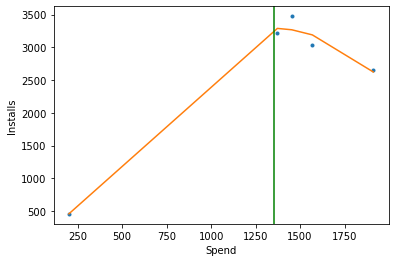

September CA


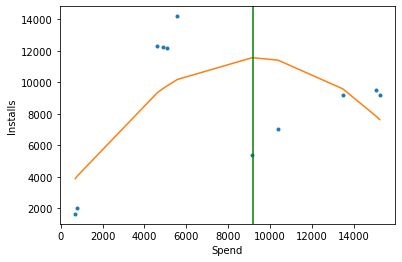

September CO


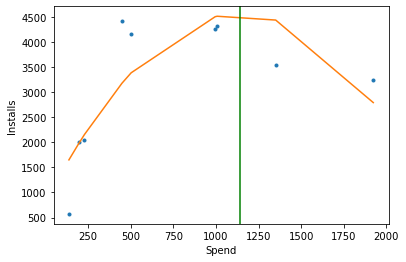

September DE


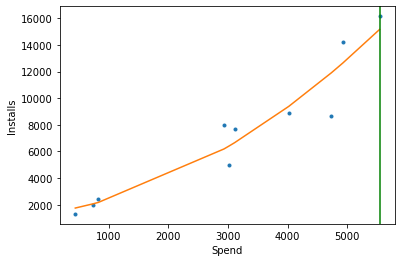

September DK


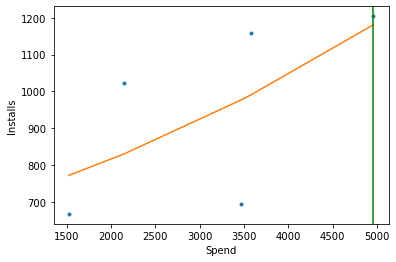

September ES


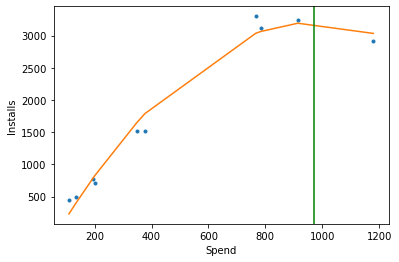

September FR


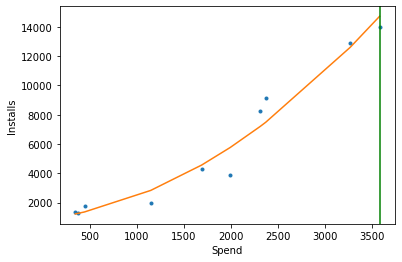

September GB


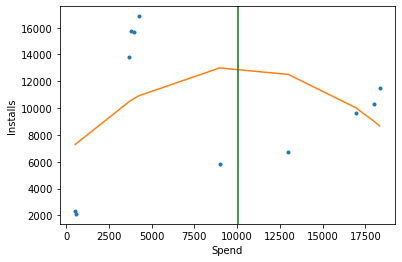

September ID


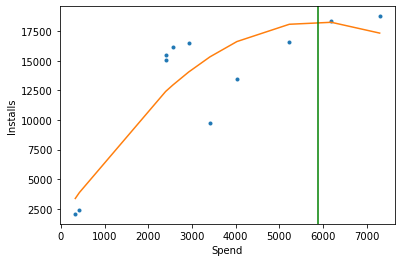

September IN


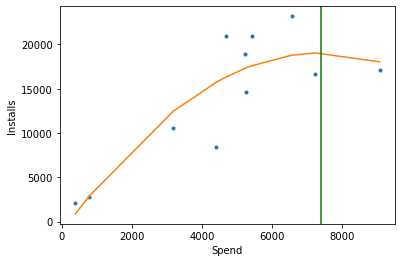

September IT


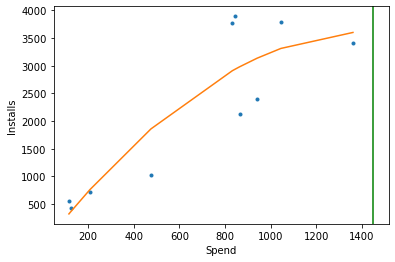

September JP


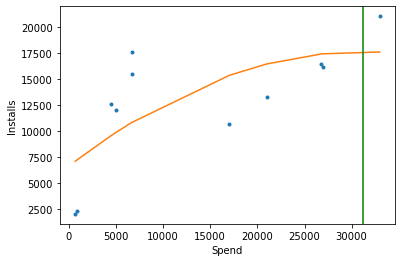

September KH


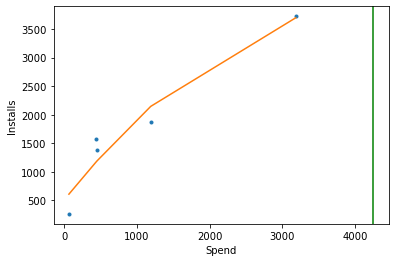

September KR


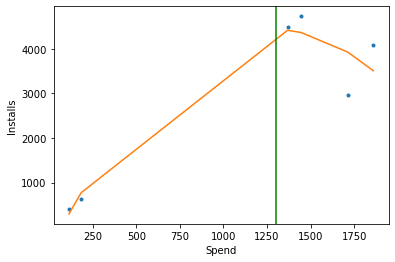

September MX


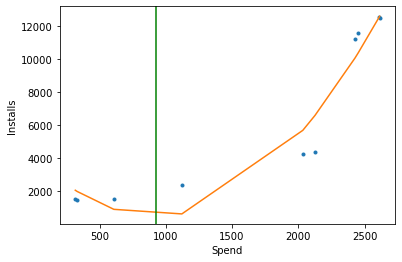

September MY


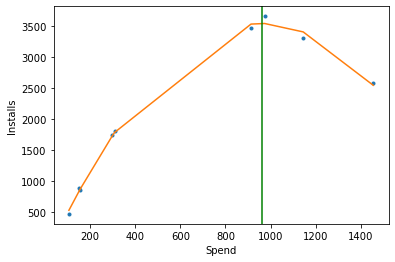

September NL


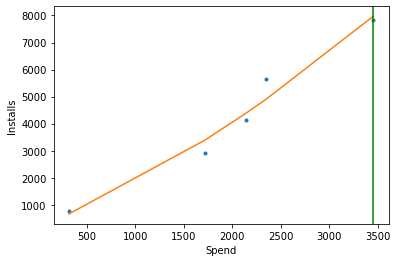

September NO


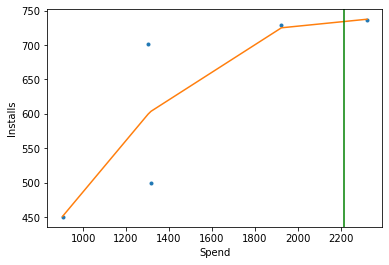

September PH


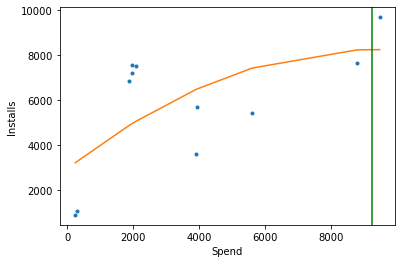

September PK


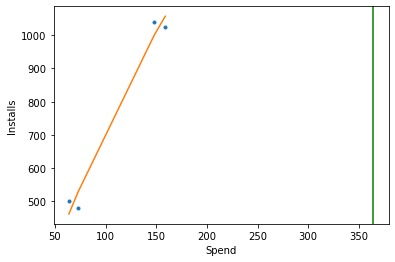

September PL


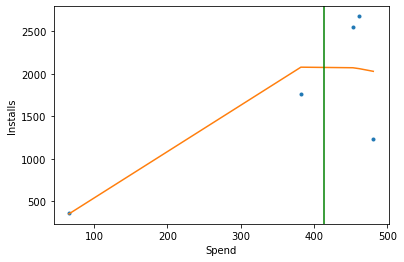

September RU


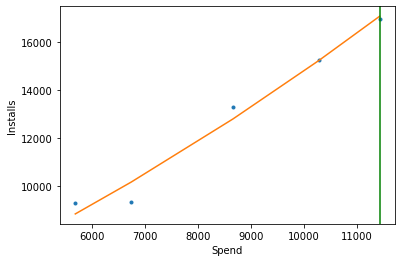

September SA


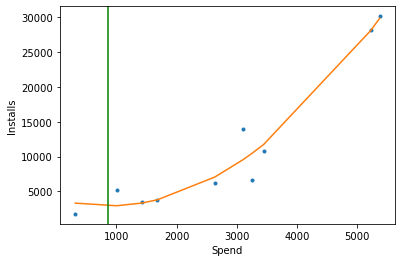

September SE


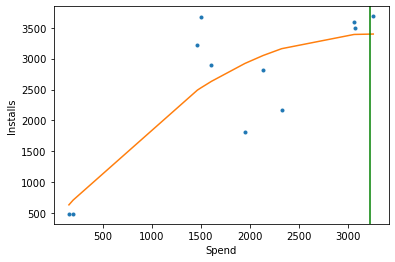

September TH


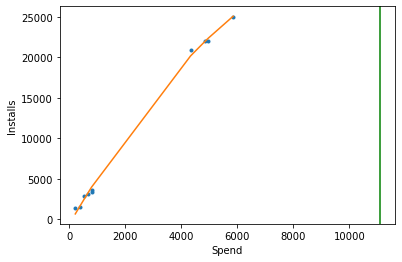

September TW


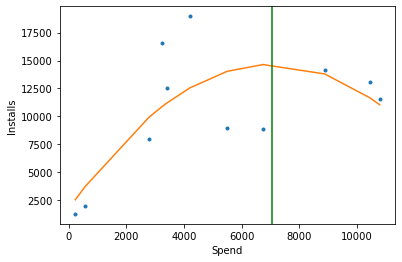

September UA


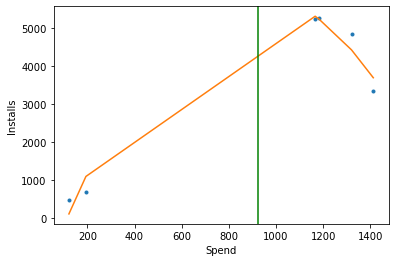

September US


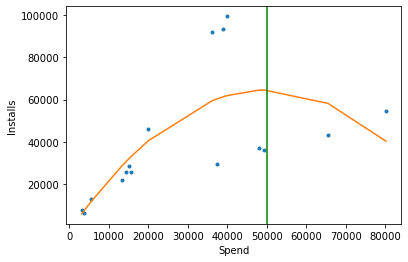

September VN


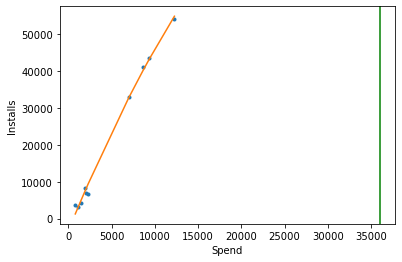

September ZA


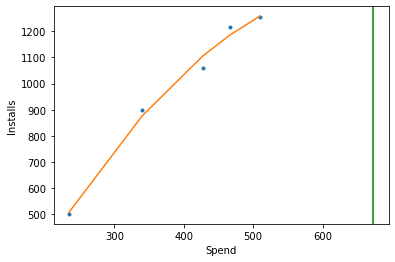

All Months All Markets


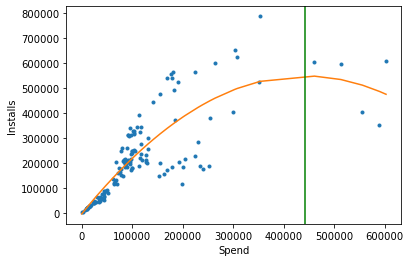

April All Markets


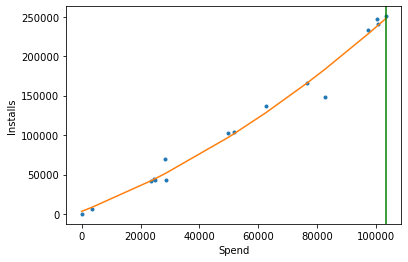

August All Markets


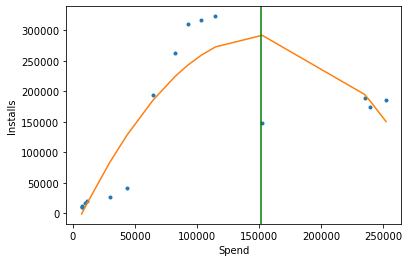

December All Markets


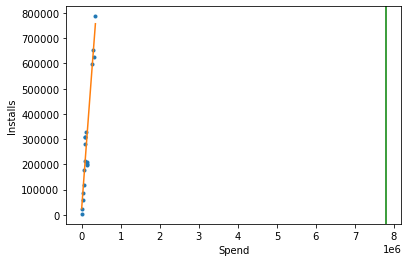

February All Markets


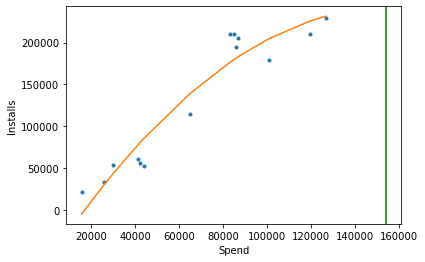

January All Markets


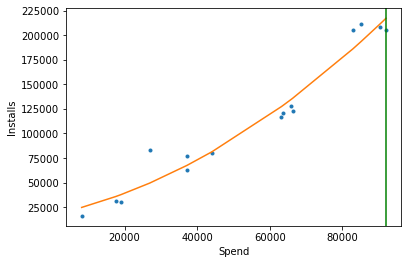

July All Markets


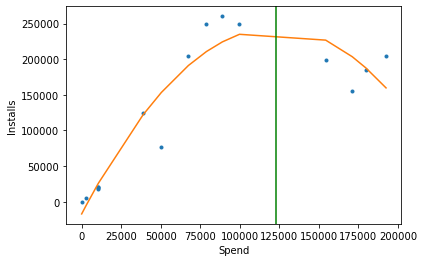

June All Markets


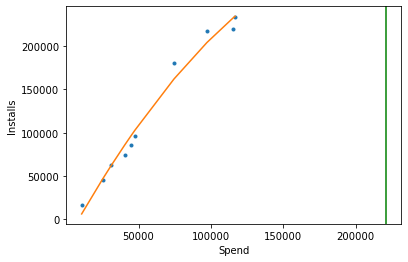

March All Markets


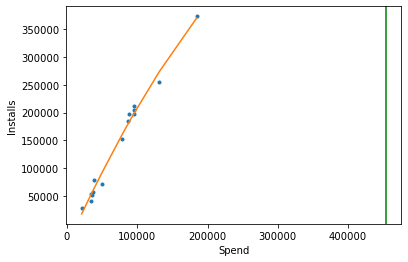

May All Markets


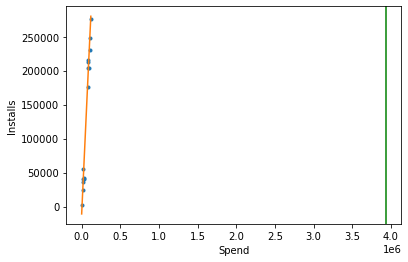

November All Markets


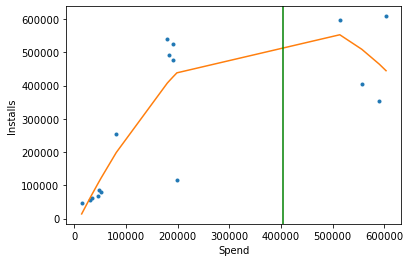

October All Markets


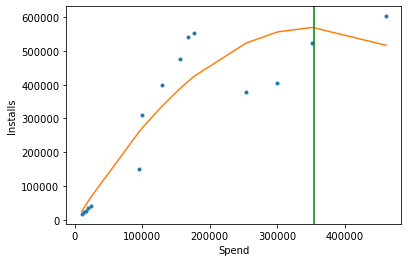

September All Markets


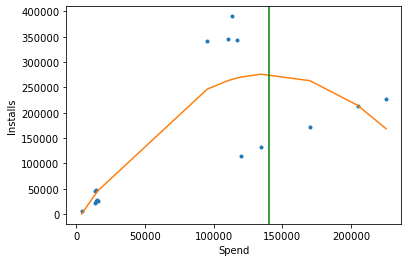

All Months AE


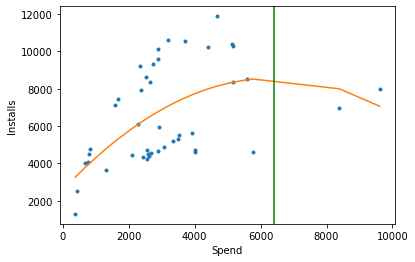

All Months AL


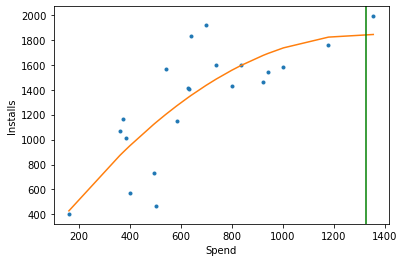

All Months AR


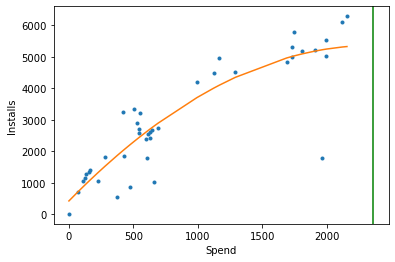

All Months AT


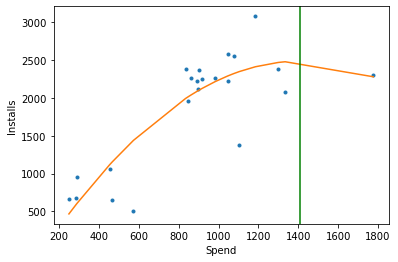

All Months AU


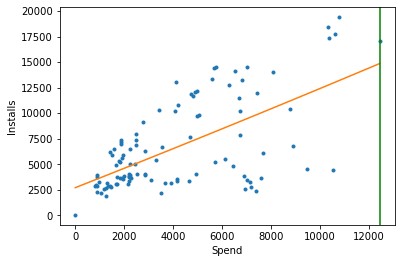

All Months BE


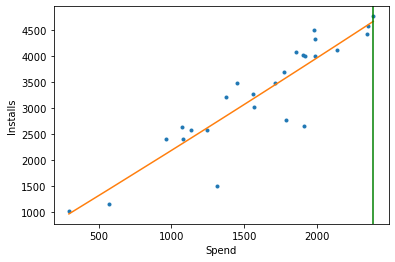

All Months CA


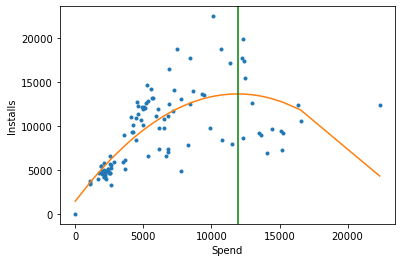

All Months CH


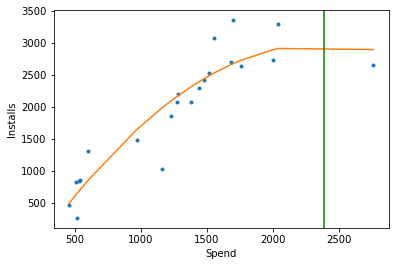

All Months CL


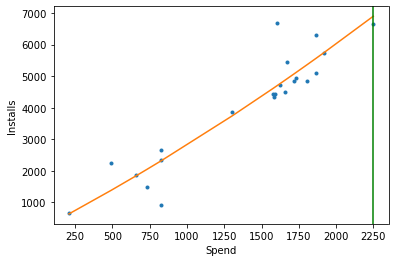

All Months CO


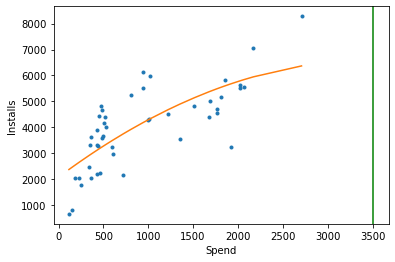

All Months CZ


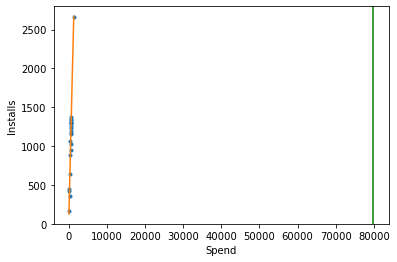

All Months DE


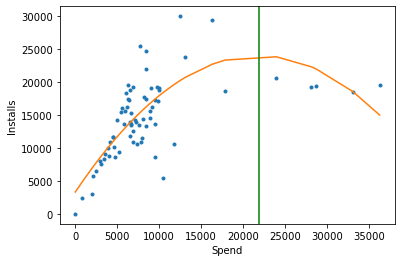

All Months DK


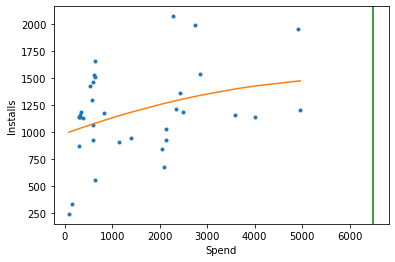

All Months EC


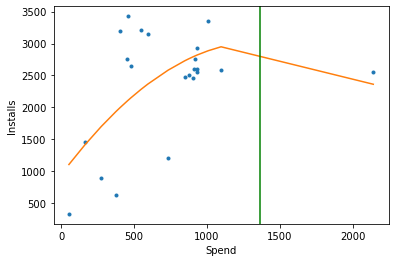

All Months EG


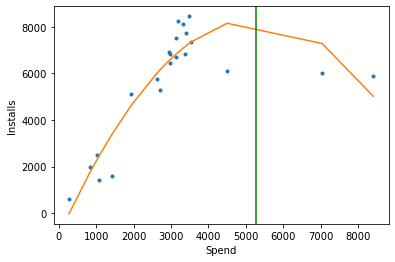

All Months ES


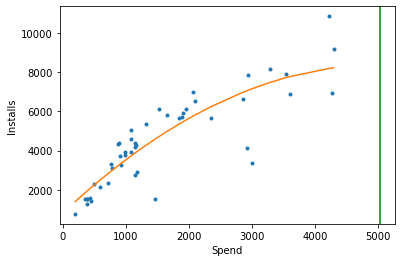

All Months FI


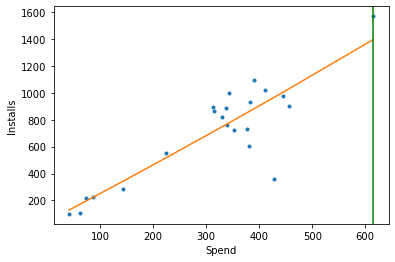

All Months FR


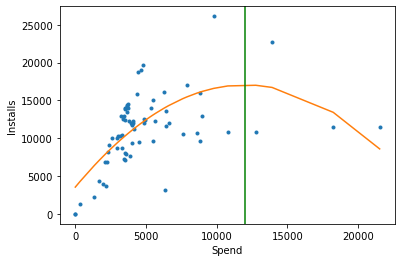

All Months GB


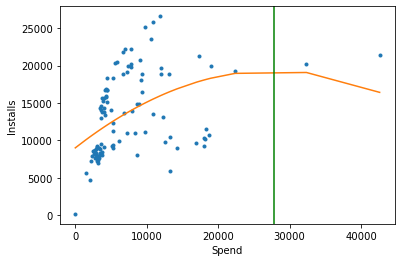

All Months GR


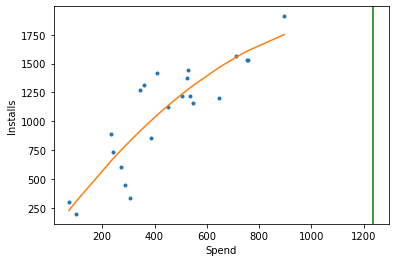

All Months HK


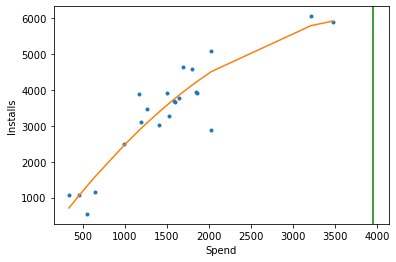

All Months HR


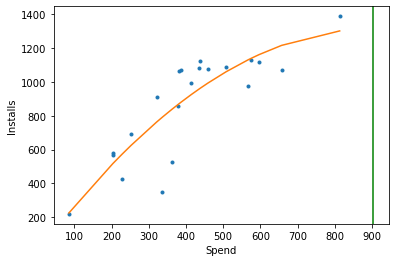

All Months HU


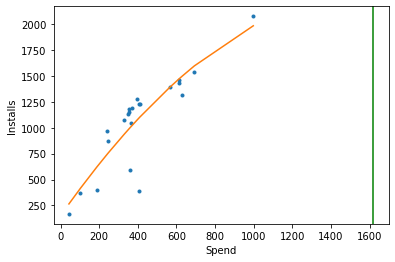

All Months ID


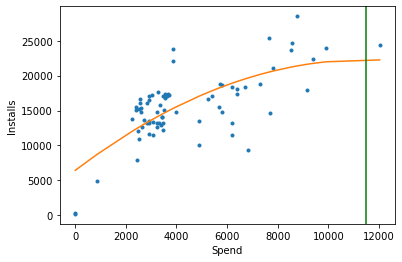

All Months IE


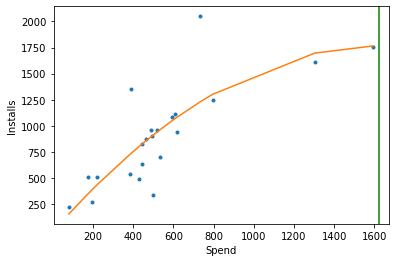

All Months IL


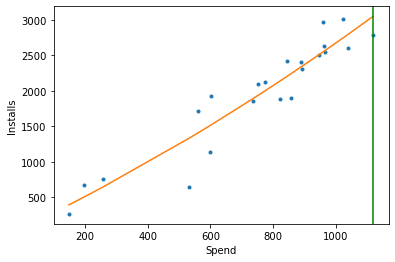

All Months IN


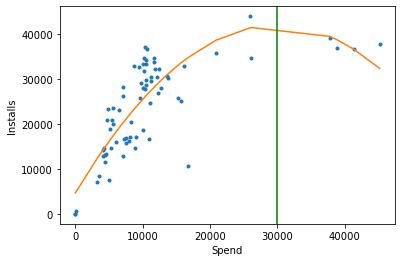

All Months IT


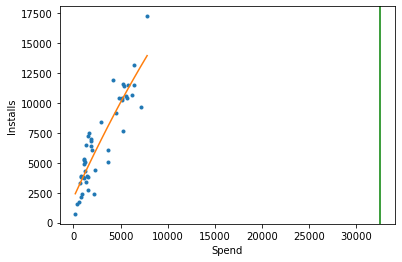

All Months JO


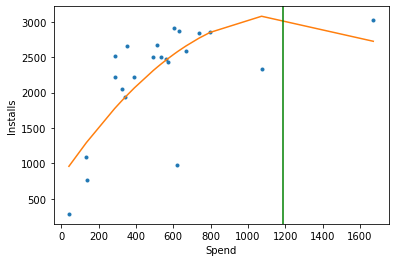

All Months JP


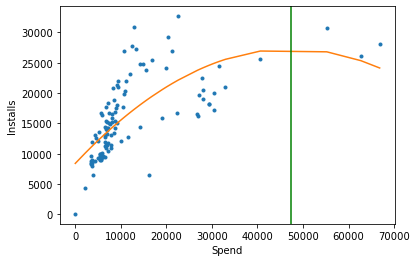

All Months KH


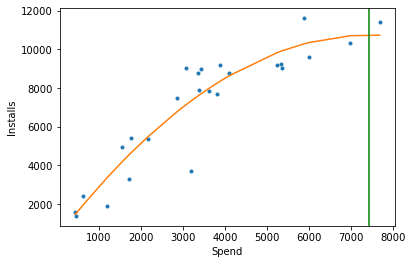

All Months KR


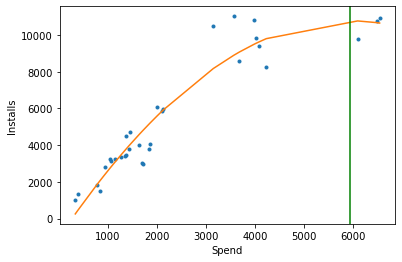

All Months KW


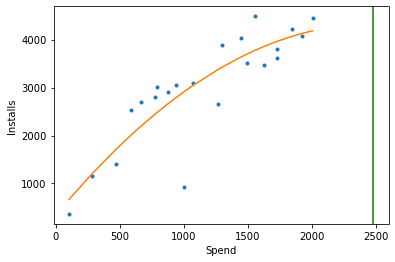

All Months KZ


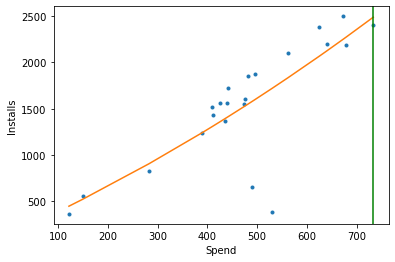

All Months LB


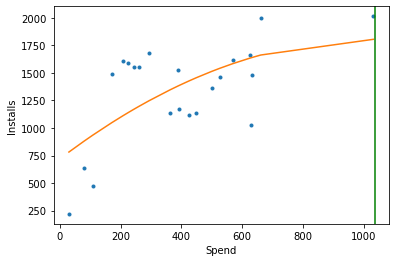

All Months MO


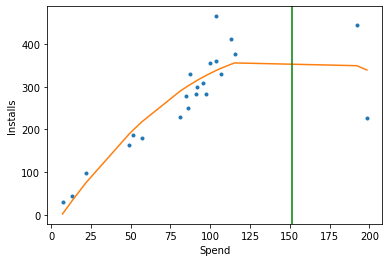

All Months MX


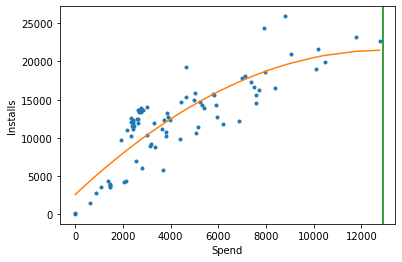

All Months MY


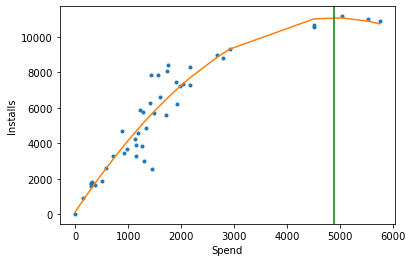

All Months NL


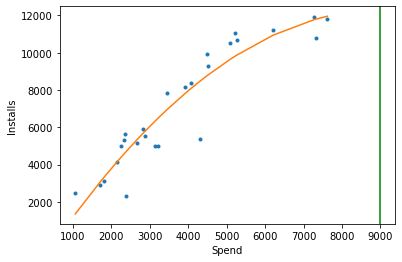

All Months NO


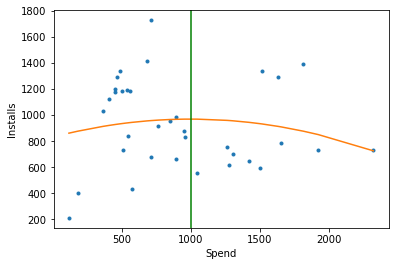

All Months NZ


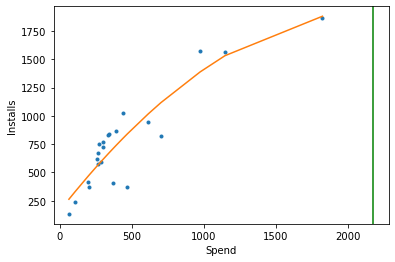

All Months OM


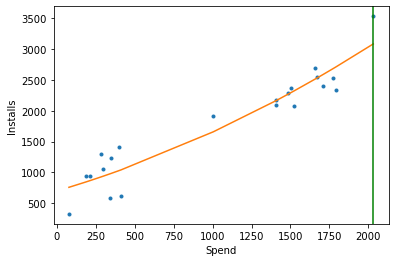

All Months PE


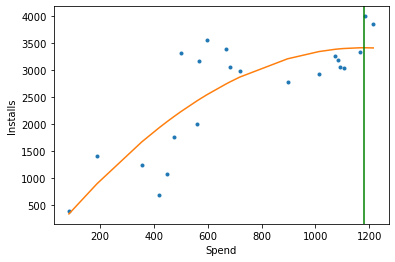

All Months PH


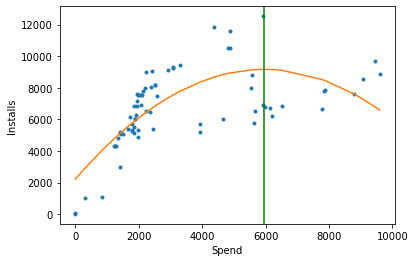

All Months PK


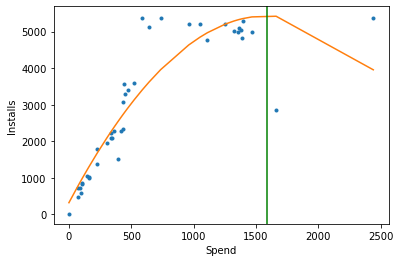

All Months PL


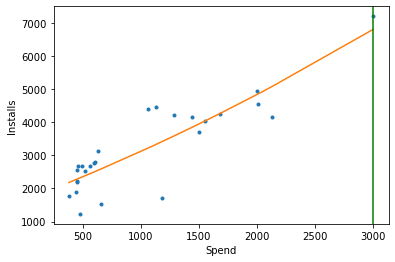

All Months PT


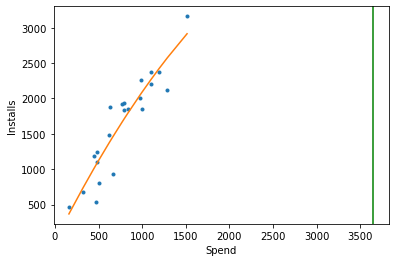

All Months QA


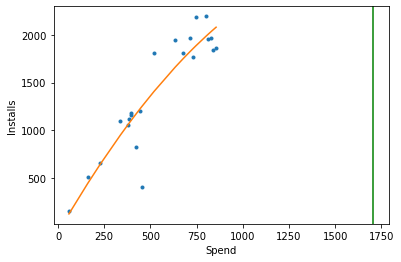

All Months RO


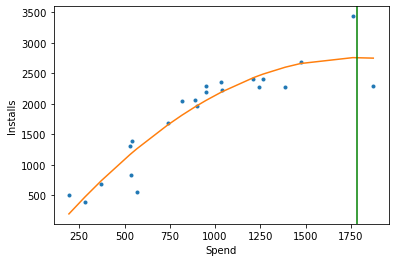

All Months RU


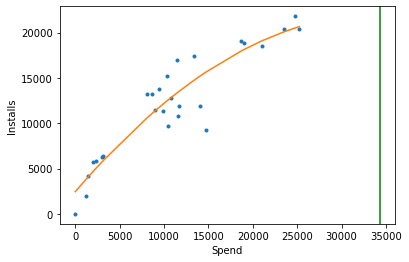

All Months SA


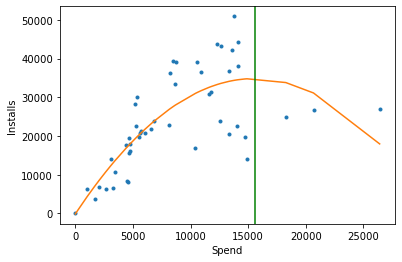

All Months SE


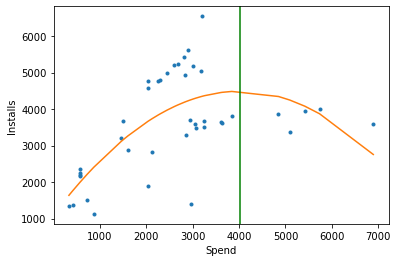

All Months SG


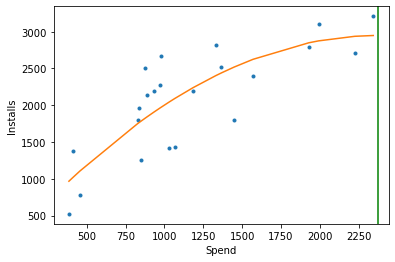

All Months TH


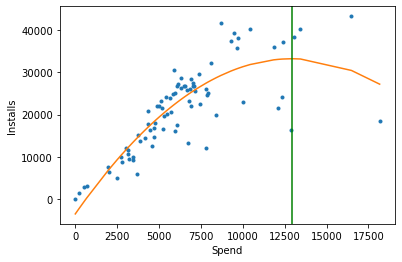

All Months TW


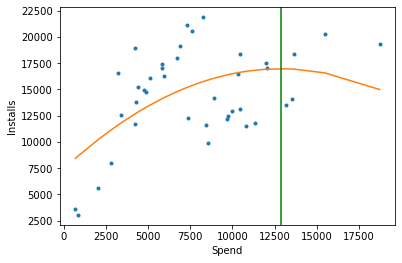

All Months UA


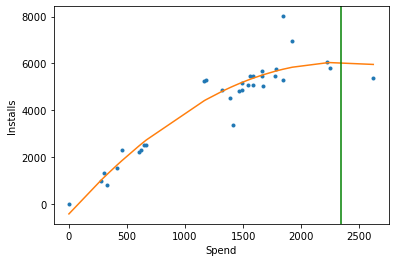

All Months US


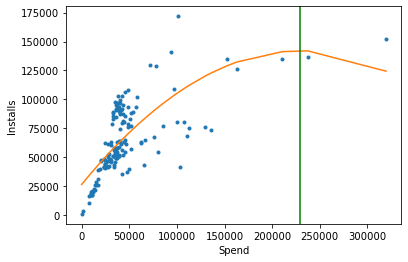

All Months VN


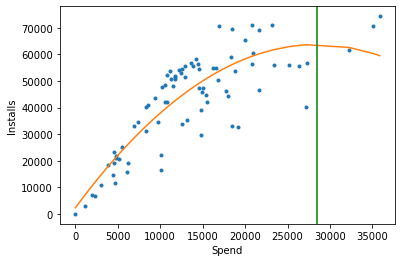

All Months ZA


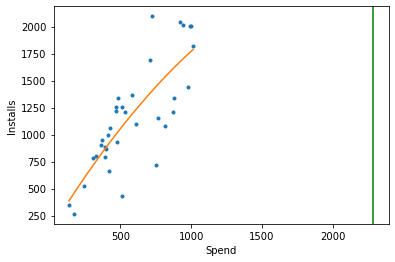

April FUDJE+IN


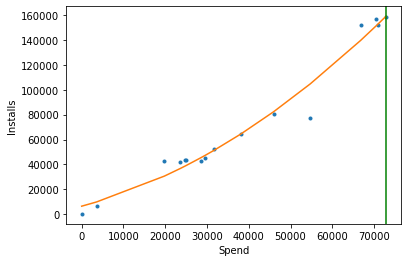

August FUDJE+IN


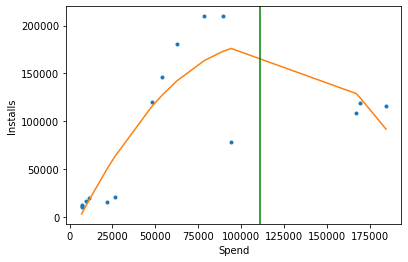

December FUDJE+IN


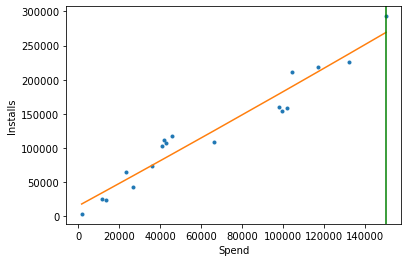

February FUDJE+IN


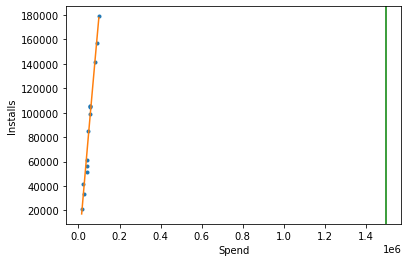

January FUDJE+IN


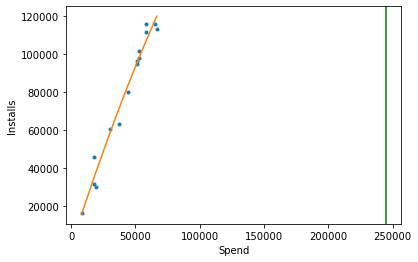

July FUDJE+IN


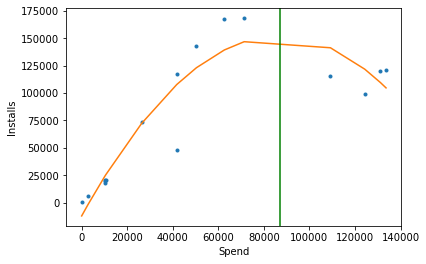

June FUDJE+IN


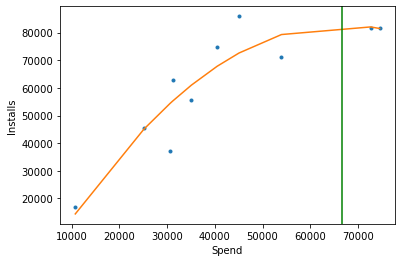

March FUDJE+IN


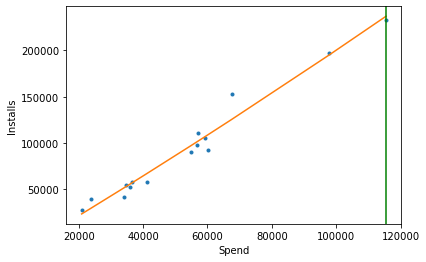

May FUDJE+IN


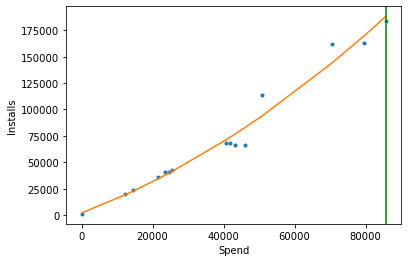

November FUDJE+IN


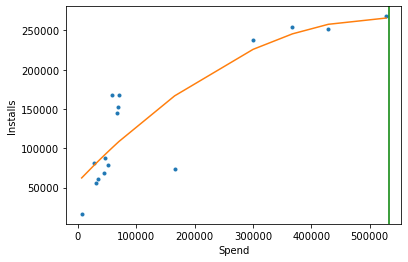

October FUDJE+IN


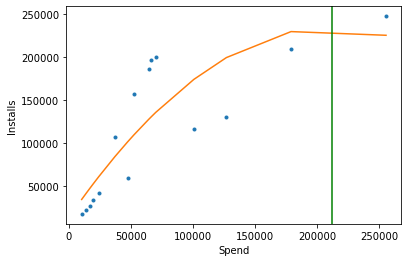

September FUDJE+IN


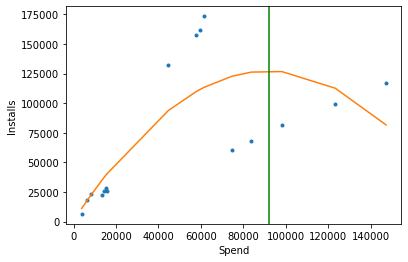

In [13]:
#Fit each dataframe

output_table = []

for df1 in list_of_dfs:
    df1 = df1.sort_values(by = 'Spend')
    #Note: error in polyfit model if sum is 0
    if (df1.Installs.sum() != 0 and df1.Spend.sum()!= 0):
        #Remove all entries where either installs is 0 or spend is 0
        print(df1.Month.iloc[0], df1.Market.iloc[0])

        #Fit model and get coefficients
        coef_2, coef, intercept = np.polyfit(df1.Spend, df1.Installs, 2)
        
        #Get vertex point (max spend before dimishing returns)
        if -coef/(2*coef_2) > min(df1.Spend):   
            max_spend = -coef/(2*coef_2)
        else:
            max_spend = max(df1.Spend)
        max_CPI = max_spend/(intercept + coef * max_spend + coef_2 * max_spend**2)
        
        #Create row entry
        df_row = [coef_2, coef, intercept, max_spend, max_CPI, df1.Month.iloc[0], df1.Market.iloc[0]]
        output_table += [df_row]
        
        #Choose random sample of charts to plot (too many to plot all)
        if sample([True]*1 +[False]*100,1):
            plt.plot(df1.Spend, df1.Installs, '.')
            plt.plot(df1.Spend, intercept + coef*df1.Spend + coef_2*df1.Spend**2)
            if type(max_spend) != str:
                plt.axvline(x = max_spend, color = 'green', linestyle = '-')
            plt.xlabel("Spend")
            plt.ylabel("Installs")
            plt.show()
    else:
        #Replacing coef and intercept values with 0 since polyfit model errs
        df_row = [0, 0, 0, 0, 0,
                  df1.Month.iloc[0], df1.Market.iloc[0]]
        output_table += [df_row]

#Format output table as dataframe
coefficients_table = pd.DataFrame(output_table, columns = ['Spend_2_Coefficient','Spend_Coefficient', 
                                                           'Spend_Intercept', 'Max Spend', 'Max CPI',
                                                            'Month', 'Market'])


In [68]:
coefficients_table.head(20)

,Spend_2_Coefficient,Spend_Coefficient,Spend_Intercept,Max Spend,Max CPI,Month,Market
0,0.023875,1.542589,99.666667,64.610000,0.216087,April,AR
1,-0.000475,6.160507,-6412.690533,6481.728364,0.478262,April,AU
2,-0.000084,2.492423,-530.251316,14837.105471,0.826123,April,CA
3,0.036873,1.662971,75.000000,45.100000,0.200444,April,CO
4,-0.000411,6.263147,-8472.695521,7625.305859,0.494940,April,DE
5,0.006983,0.949088,129.000000,135.920000,0.351214,April,ES
6,0.002532,-9.949446,11166.153493,1964.847915,1.411955,April,FR
7,-0.000088,3.521240,-2476.888652,20012.136384,0.610929,April,GB
8,-0.000315,4.834212,63.285734,7682.994492,0.412313,April,ID
9,-0.001546,9.341902,-167.564034,3021.278753,0.216662,April,IN


#### Getting R^2

In [15]:
list_r2 = []

for rdf in range(len(list_of_dfs)):
    dfa = list_of_dfs[rdf]
    y = dfa.Installs
    yhat = coefficients_table.Spend_Intercept.iloc[rdf
                                                   ] + coefficients_table.Spend_Coefficient.iloc[rdf
                                                                                                ] * dfa.Spend + coefficients_table.Spend_2_Coefficient.iloc[rdf] * dfa.Spend**2
    ybar = np.sum(y)/len(y)          # or sum(y)/len(y)
    ssreg = np.sum((yhat-ybar)**2)   # or sum([ (yihat - ybar)**2 for yihat in yhat])
    sstot = np.sum((y - ybar)**2)    # or sum([ (yi - ybar)**2 for yi in y])
    list_r2 += [ssreg / sstot]

list_r2 = [r for r in list_r2 if str(r) != 'nan' and str(r) != 'inf']
avg_r2 = sum(list_r2)/len(list_r2)

print('Average R2: ' + str(avg_r2))

C:\Users\ELDA~1.PER\AppData\Local\Temp/ipykernel_32468/3937163632.py:12: RuntimeWarning:

invalid value encountered in double_scalars

C:\Users\ELDA~1.PER\AppData\Local\Temp/ipykernel_32468/3937163632.py:12: RuntimeWarning:

divide by zero encountered in double_scalars



Average R2: 0.810088965349417


**Troubleshooting CA Market Scenario:** <br>


In [16]:
#CPI = 2 #common range: 0.10 - 2.50. Canada: spend 8042, Installs 31211, CPI 0.26

CPI: 0.26
Installs: 282277.6812626915
Spend: 73392.1971282998
Max Spend:9416.02
Max CPI:0.6661983123830681


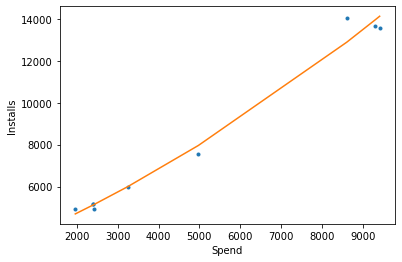

In [17]:
CPI = 0.26
month = 'February'
market = 'CA'

for i in range(len(coefficients_table)):
    if coefficients_table['Month'].iloc[i] == month:
        if coefficients_table['Market'].iloc[i] == market:
            coef2 = coefficients_table['Spend_2_Coefficient'].iloc[i]
            coef = coefficients_table['Spend_Coefficient'].iloc[i]
            intercept = coefficients_table['Spend_Intercept'].iloc[i]
            
            Install12 = (1-coef*CPI - np.sqrt((coef*CPI-1)**2 - 4*coef2*intercept*CPI**2))/(2*coef2*CPI**2)
            Install2 = (1-coef*CPI + np.sqrt((coef*CPI-1)**2 - 4*coef2*intercept*CPI**2))/(2*coef2*CPI**2)
            themax = max(Install12, Install2)
            print('CPI: ' + str(CPI))
            print('Installs: ' + str(themax))
            print('Spend: ' + str(themax*CPI))
            print('Max Spend:' + str(coefficients_table['Max Spend'].iloc[i]))
            print('Max CPI:' + str(coefficients_table['Max CPI'].iloc[i]))
            for j in list_of_dfs:
                if j.Month.iloc[0] == month:
                    if j.Market.iloc[0] == market:
                        dff = j
            
            dff = dff.sort_values(by = 'Spend')
            plt.plot(dff.Spend, dff.Installs, '.')
            plt.plot(dff.Spend, intercept + coef*dff.Spend + coef2*dff.Spend**2)
            plt.xlabel("Spend")
            plt.ylabel("Installs")
            plt.show()
            

#### Save to CSV

In [18]:
#coefficients_table = coefficients_table.rename(columns = {'Spend_2_Coefficient': 'Install_2_Coefficient', 'Spend_Coefficient': 'Install_Coefficient', 'Spend_Intercept':'Install_Intercept'})

In [117]:
#Divya --> divide spend/installs by 7 and multiply by 30

coefficients_table.to_csv("googlemaps_coefficients.csv")

In [20]:
#coefficients_table

In [21]:
#Install12 = (1-Install_Coefficient*CPI - np.sqrt((Install_Coefficient*CPI-1)**2 - 4*Install_2_Coefficient*Install_Intercept*CPI**2))/(2*Install_2_Coefficient*CPI**2)
#Install2 = (1-Install_Coefficient*CPI + np.sqrt((Install_Coefficient*CPI-1)**2 - 4*Install_2_Coefficient*Install_Intercept*CPI**2))/(2*Install_2_Coefficient*CPI**2)
#Final_Install = max(Install12, Install2)

In [22]:
#For later when regressing install on spend: Install = (1-fInstall_Coefficient*CPI - np.sqrt((fInstall_Coefficient*CPI-1)**2 - 4*fInstall_2_Coefficient*fInstall_Intercept*CPI**2))/(2*fInstall_2_Coefficient*CPI**2)

In [23]:
#Rn: run markets without months to check if weird numbers.If weird, by quarter.
#First scenario in email = vertex task.
#LTV = CPI when breakeven (ROI = 0). There's an email. Nothing to do on backend, user just inputs the LTV numbers.
#Last scenario: Spend is input. But spend input has to be efficiently split accross markets. Optimization part. Multiple components.

Prithvi 12/15 Notes: <br>
Want to set spend as input. Also install goal. 
Drag and drop to play with spend levels and install goals i want to hit by market.
#Next optimization goal: set macro budget/spend and figures out how much to spend in each country. IE show best scenario.
Prithvi gets back 1/10. Will have first two scenarios ready. Last one we'll let her know what we can do. 

NVM on optimization from chelsea!
Add caviot: Only one year of data --> hard to generalize which months do better. Might be useful to throw out 2020. <br>
Plot CPI against Month. Find best (min?) CPI value across months but would need more month data. Also want to validate that the spend affects the number of installs for the same month. But can't constrain average CPI. Question for Chelsea: do we need min spend per month or other constraints? Otherwsie all money goes to lowest CPI month.<br>
[do this first]Should check if each month is significantly different from the total divided by 12 to see if it's even worth optimizing over month. <br>

## Optimization Model

Both SciPy and Pulp seem like reasonable options. We start with a single month across markets. Using this article for reference: https://towardsdatascience.com/a-simple-way-to-optimize-something-in-python-740cda7fd3e0 

#### Import Packages

In [24]:
#pip install pulp

In [25]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import pulp
import pandas as pd
import matplotlib.pyplot as plt


#### Preprocessing

In [26]:
#Preprocessing function for all data

def preprocessing(df):
    """Cleans data according to domain and technical requirements."""

    # Converting 'Day' into a date
    df['Month'] = pd.to_datetime(df['Day']).dt.month_name()

    # renaming column per Chelsea's instructions
    df.rename(columns={'Country or Region': "Market"}, inplace=True)
    
    # add boolean is_FUDJEIN column
    fudjein_bool = df.Market.isin(['FR', 'DE', 'GB', 'JP', 'US', 'IN'])
    df['is_FUDJEIN'] = fudjein_bool
    
    #remove all zero values
    df = df[(df['Installs'] > 0)][(df['Spend'] > 0)]
    
    #aggregate weekly
    df['Date'] = pd.to_datetime(df['Day'])

    
    #NVM:
    #Add CPI to table
    #df['CPI'] = df['Spend'].div(df['Installs']) 
    #Deal with division by 0.
    #df.loc[~np.isfinite(df['CPI']), 'CPI'] = 0
            
    return df[['Installs', 'Spend', 'Market', 'Month', 'is_FUDJEIN', 'Date']]

In [27]:
#Read in data sets and merge the tables. ------------------->Try just one if errors persist.
#a = pd.read_csv('Maps 2018 data.csv')
#b = pd.read_csv('2019 Maps Data.csv')
df = pd.read_csv('6 month data pull for dashboard (3).csv')
#df = pd.concat([a,b,c], ignore_index = True)

In [28]:
#Preprocess the merged table ----------------------------> Ask why no primary key (ex: 5 values for US in Feb on 2/1/18). 

df = preprocessing(df)
df.head()

C:\Users\ELDA~1.PER\AppData\Local\Temp/ipykernel_32468/307009679.py:17: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,Installs,Spend,Market,Month,is_FUDJEIN,Date
0,224,260.11,SG,November,False,2021-11-08
1,181,229.94,VN,November,False,2021-11-08
2,419,813.66,SA,November,False,2021-11-06
3,8,8.49,AE,August,False,2021-08-15
4,1945,1791.72,TW,August,False,2021-08-15


In [29]:
#Preprocess to fit optimization requirements 
pd.set_option('display.max_colwidth', None)
#Question for Chelsea. Which of the values below (if not sum) do we use from (ex: 5 values for US in Feb on 2/1/18).
month = 'July'
feb_df = df[df['Month'] == month].drop(columns = ['is_FUDJEIN', 'Month']).sort_values(by = 'Date')
feb_df.head()

,Installs,Spend,Market,Date
181729,6,0.27,PK,2021-07-01
554834,11,0.20,SA,2021-07-01
452976,202,33.70,VN,2021-07-01
453010,11,1.88,SA,2021-07-01
453074,8,2.84,US,2021-07-01


In [30]:
#Aggregate all to weekly level
weekly_group = feb_df.groupby([pd.Grouper(key='Date', freq='W'), pd.Grouper(key = 'Market')]).agg({'Installs': 'sum', 'Spend': 'sum',  
                                                    }).reset_index()
weekly_df = weekly_group[(weekly_group['Installs'] > 0)][(weekly_group['Spend'] > 0)]
weekly_df.head()

,Date,Market,Installs,Spend
0,2021-07-04,AE,1303,379.81
1,2021-07-04,AR,58,5.90
2,2021-07-04,AU,1223,461.42
3,2021-07-04,CA,2273,1100.15
4,2021-07-04,CO,67,2.90


In [31]:
#Pivot table so that each column is the spend for that market. The spend is the total for that week (across campaigns)

pivot_df = pd.pivot_table(weekly_df, values='Spend', index=['Date'],
                    columns=['Market'], aggfunc=np.sum)
pivot_df['Installs'] = weekly_df[['Installs', 'Date']].groupby('Date').sum()
pivot_df.head()

Market,AE,AR,AU,CA,CO,DK,ES,GB,ID,IN,...,PK,RU,SA,SE,TH,TW,US,VN,ZA,Installs
Date,,,,,,,,,,,,,,,,,,,,,
2021-07-04,379.81,5.9,461.42,1100.15,2.9,89.87,1.76,1648.09,1477.27,3245.11,...,0.53,1197.63,2021.60,NaN,24.54,844.48,34796.02,39.85,135.49,76242
2021-07-11,2101.53,NaN,3109.40,5333.00,NaN,298.67,NaN,6068.62,4880.82,8123.36,...,NaN,8995.64,12581.01,NaN,NaN,4208.53,84893.58,NaN,611.94,198912
2021-07-18,2627.80,NaN,4141.09,6175.37,NaN,385.84,NaN,7285.84,6188.38,7523.57,...,NaN,11624.93,14028.06,NaN,NaN,7356.77,107265.73,NaN,761.73,204142
2021-07-25,2435.62,NaN,3657.00,6786.35,NaN,604.66,NaN,8396.94,4900.30,8847.95,...,NaN,11588.70,4534.09,NaN,NaN,8455.01,99702.02,NaN,869.92,184341
2021-08-01,2475.15,NaN,3360.39,7079.01,NaN,721.78,NaN,8504.10,6721.93,3776.38,...,NaN,8964.70,NaN,2349.79,NaN,8640.45,96332.22,NaN,756.95,155665


In [32]:
#Validation
def val():
    x = pd.read_csv('6 month data pull for dashboard (3).csv')
    x = preprocessing(x)
    x=x[x['Date'] == '2021-02-01']['Installs'].sum()
    x=x[x['Date'] == '2021-02-01'][x['Market' == 'US']]['Spend'].sum()
    return None

#### Forecast Model

Regress Installs on Spend for the table above. Starting with linear and then nonlinear after.

In [33]:
pivot_df = pivot_df.reset_index(drop = True)
#Drop columns with null values.
pivot_df.dropna(axis=1, inplace=True)
#Prepare data for regression
feature_cols = list(set(pivot_df.columns).difference(['Installs']))
pivot_df = pivot_df.sort_values(by = 'Installs')
X = pivot_df[feature_cols]
y = pivot_df[["Installs"]]
# instantiate and fit
lr = LinearRegression()
model = lr.fit(X, y)
# print the coefficients
print(model.intercept_)
print(model.coef_)

[-13329.43341214]
[[ 2.45161995e+00  1.95802649e+00  1.02124232e+00  1.22522385e+00
  -1.23327196e+01 -8.53258078e-01  5.18300686e+00 -5.96794362e-01
   4.82655719e+00 -5.56740487e-01 -4.95565952e+00 -2.16151992e-01
   2.07836039e+00 -1.13523661e-02]]


R2: 1.0
RMSE: 1.3976043629695955e-21


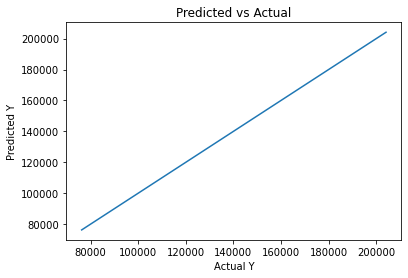

In [34]:
#Check that relationship between actual and predicted values are sufficiently linear at 45 degrees.
#Note: need to add data points.
plt.plot(y, model.predict(X))
plt.xlabel("Actual Y")
plt.ylabel("Predicted Y")
plt.title("Predicted vs Actual")
print("R2: " + str(r2_score(y, model.predict(X))))
print("RMSE: " + str(mean_squared_error(y, model.predict(X))))

#### Optimization Model

Define the problem.

In [35]:
prob = pulp.LpProblem("Budget Optimization Across Markets", pulp.LpMaximize)

C:\Users\elda.pere\Anaconda3\lib\site-packages\pulp\pulp.py:1352: UserWarning:

Spaces are not permitted in the name. Converted to '_'



Set constraints on each independent market and for overall budget.

In [36]:
#Max spend for each market from chart vertex (like last time)
list_of_variables = []
for feature in feature_cols:
    variable_name = feature #+ '_Spend'
    #vertex = 100000 #------------------------> to be changed to unique vertex per market when doing nonlinear. 
                                            #Still not sure if vertex should be from unique model or aggregate all markets.
    vertex = coefficients_table[coefficients_table.Month == month][coefficients_table.Market == feature]['Max Spend'].iloc[0]
    list_of_variables += [pulp.LpVariable(variable_name, 50, vertex)]
    
#Overall budget constraint
monthly_budget_constraint = 50000
prob += sum(np.dot(list_of_variables, model.coef_[0])) >= 0
prob += sum(list_of_variables) >= 0
prob += sum(list_of_variables) <= monthly_budget_constraint*7/30

C:\Users\ELDA~1.PER\AppData\Local\Temp/ipykernel_32468/3598738439.py:7: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



Get coefficients of each variable and determine objective function to minimize.

In [37]:
#Coefficients a, b, ... , d
coef = model.coef_

# Objective function: 
#Installs = a* US_spend + b*IN_Spend + .... + d
objective_func = [model.intercept_[0]]
for index in range(coef.size):
    objective_func += [coef.item(index)*list_of_variables[index]]
    
prob += sum(objective_func)

Solve the optimization problem. 

In [38]:
# describe the problem
print(prob)

# solve the LP using the default solver
optimization_result = prob.solve()

# make sure we got an optimal solution
assert optimization_result == pulp.LpStatusOptimal

# display the results
print('Optimal ROI: {}'.format(prob.objective.value()))
print('-' * 30)

for var in list_of_variables:
    print('Optimal spend on {}: {:0.02f}'.format(var.name, var.value()))

for missing_var in list(set(df.Market.unique()).difference(feature_cols)):
    print('Optimal spend on {}: No Data Available'.format(missing_var))
    
#Divide Optimal spend over ROI for optimal CPI

Budget_Optimization_Across_Markets:
MAXIMIZE
1.225223849001882*AE + 1.0212423239576924*AU + 2.4516199519919195*CA + -0.5567404872191744*DK + -0.596794361929332*GB + 4.826557189853685*ID + 5.183006857519838*IN + 1.9580264911655414*JP + -0.8532580775035838*NO + -4.95565952130877*PH + -0.011352366059245578*RU + -12.332719594478261*TW + 2.0783603925807648*US + -0.21615199200477742*ZA + -13329.433412136423
SUBJECT TO
_C1: AE + AU + CA + DK + GB + ID + IN + JP + NO + PH + RU + TW + US + ZA >= 0

_C2: AE + AU + CA + DK + GB + ID + IN + JP + NO + PH + RU + TW + US + ZA >= 0

_C3: AE + AU + CA + DK + GB + ID + IN + JP + NO + PH + RU + TW + US + ZA
 <= 11666.6666667

VARIABLES
50 <= AE <= 2219.84436022 Continuous
50 <= AU <= 34440.1588746 Continuous
50 <= CA <= 4619.91743088 Continuous
50 <= DK <= 529.293023201 Continuous
50 <= GB <= 5509.88899043 Continuous
50 <= ID <= 4456.54736802 Continuous
50 <= IN <= 7001.4756167 Continuous
50 <= JP <= 10447.4066745 Continuous
50 <= NO <= 905.289623081 Con

Putting everything together in one function.

In [118]:
#pip install pulp
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import pulp
import pandas as pd
import matplotlib.pyplot as plt


#Preprocessing function for all data

def preprocessing(df):
    """Cleans data according to domain and technical requirements."""

    # Converting 'Day' into a date
    df['Month'] = pd.to_datetime(df['Day']).dt.month_name()

    # renaming column per Chelsea's instructions
    df.rename(columns={'Country or Region': "Market"}, inplace=True)
    
    # add boolean is_FUDJEIN column
    fudjein_bool = df.Market.isin(['FR', 'DE', 'GB', 'JP', 'US', 'IN'])
    df['is_FUDJEIN'] = fudjein_bool
    
    #remove all zero values
    df = df[(df['Installs'] > 0)][(df['Spend'] > 0)]
    
    #aggregate weekly
    df['Date'] = pd.to_datetime(df['Day'])
            
    return df[['Installs', 'Spend', 'Market', 'Month', 'is_FUDJEIN', 'Date']]

def get_quarter(x):
    if x in ['January', 'February', 'March']:
        return 1
    elif x in ['April', 'May', 'June']:
        return 2
    elif x in ['July', 'August', 'September']:
        return 3
    else:
        return 4

#Optimization model function 
def optimization_model(df, quart, markets, spend_lower_bound, monthly_budget_constraint = 50000):
    #Set Market constraint
    df = df[df.Market.isin(markets)]
    df['Quarter'] = df.Date.dt.quarter
    
    #Initialize output dictionary:
    output_dict = {}
    output_dict['Quarter'] = []
    output_dict['Optimal_Installs'] = []
    for market in df.Market.unique():
        output_dict[market] = []
        output_dict[market + '_Lower_Bound'] = []
        output_dict[market + '_Upper_Bound'] = []
    
    #Set optimization month/market
    output_dict['Quarter'] += [quart]
    feb_df = df[df['Quarter'] == quart].drop(columns = ['is_FUDJEIN', 'Month', 'Quarter']).sort_values(by = 'Date')
    
    
    #Aggregate all to weekly level
    weekly_group = feb_df.groupby([pd.Grouper(key='Date', freq='W'), pd.Grouper(key = 'Market')]).agg({'Installs': 'sum', 'Spend': 'sum',  
                                                        }).reset_index()
    weekly_df = weekly_group[(weekly_group['Installs'] > 0)][(weekly_group['Spend'] > 0)]
    
    #Pivot table so that each column is the spend for that market. The spend is the total for that week (across campaigns)
    pivot_df = pd.pivot_table(weekly_df, values='Spend', index=['Date'],
                        columns=['Market'], aggfunc=np.sum)
    pivot_df['Installs'] = weekly_df[['Installs', 'Date']].groupby('Date').sum()

    #Regress Installs on Spend for the table above. Starting with linear and then nonlinear after.
    pivot_df = pivot_df.reset_index(drop = True)
    #Drop columns with null values.
    pivot_df.dropna(axis=1, inplace=True) #------------------------------------> HH: REPLACE THIS LINE WITH IMPUTED NULL VALUES
    #Prepare data for regression
    feature_cols = list(set(pivot_df.columns).difference(['Installs']))
    pivot_df = pivot_df.sort_values(by = 'Installs')
    X = pivot_df[feature_cols]
    y = pivot_df[["Installs"]]
    # instantiate and fit
    lr = LinearRegression()
    model = lr.fit(X, y)
    # print the coefficients
    #print(model.intercept_)
    #print(model.coef_)
    
    #-------------------Optimization Model ----------------------------------
    #Set up the optimization problem
    prob = pulp.LpProblem("Budget Optimization Across Markets", pulp.LpMaximize)
    
    #Set constraints on each independent market and for overall budget.
    #Max spend for each market from chart vertex (like last time)
    list_of_variables = []
    coefficients_table = pd.read_csv('googlemaps_coefficients.csv')
    for feature in feature_cols:
        variable_name = feature #+ '_Spend'
        coefficients_table['Quarter'] = coefficients_table['Month'].apply(get_quarter)
        vertex = coefficients_table[coefficients_table.Quarter == quart][coefficients_table.Market == feature]['Max Spend'].iloc[0]
        list_of_variables += [pulp.LpVariable(variable_name, 50, vertex)]
        output_dict[feature + '_Lower_Bound'] = spend_lower_bound
        output_dict[feature + '_Upper_Bound'] = vertex

    #Overall budget constraint
    prob += sum(np.dot(list_of_variables, model.coef_[0])) >= 0
    prob += sum(list_of_variables) >= 0
    prob += sum(list_of_variables) <= monthly_budget_constraint*7/90

    #Get coefficients of each variable and determine objective function to minimize.
    
    ##Coefficients a, b, ... , d
    coef = model.coef_

    # Objective function: 
    #Installs = a* US_spend + b*IN_Spend + .... + d
    objective_func = [model.intercept_[0]]
    for index in range(coef.size):
        objective_func += [coef.item(index)*list_of_variables[index]]

    prob += sum(objective_func)
    
    #Solve the optimization problem
        # describe the problem
    print(prob)

    # solve the LP using the default solver
    optimization_result = prob.solve()

    # make sure we got an optimal solution
    assert optimization_result == pulp.LpStatusOptimal

    # display the results
    output_dict['Optimal_Installs'] += [prob.objective.value()]
    print('Optimal ROI: {}'.format(prob.objective.value()))
    print('-' * 30)

    for var in list_of_variables:
        output_dict[var.name] += [var.value()]
        print('Optimal spend on {}: {:0.02f}'.format(var.name, var.value()))

    for missing_var in list(set(df.Market.unique()).difference(feature_cols)):
        output_dict[missing_var] += ['No Data Available']
        output_dict[missing_var + '_Lower_Bound'] += ['No Data Available']
        output_dict[missing_var + '_Upper_Bound'] += ['No Data Available']
        print('Optimal spend on {}: No Data Available'.format(missing_var))

    #Format output table as dataframe
    optimized_table = pd.DataFrame.from_dict(output_dict)
    
    return optimized_table

In [119]:
pd.set_option('display.max_columns', None)

#Read in data sets and merge the tables
a = pd.read_csv('Maps 2018 data.csv')
b = pd.read_csv('2019 Maps Data.csv')
# HH: Removing overlapped date of 12-31-2019 from 2019 df (titled "b" here)
b['Day'] = pd.to_datetime(b['Day'])
b = b.loc[b['Day'] > "2018-12-31"] 
c = pd.read_csv('6 month data pull for dashboard (3).csv')
df = pd.concat([a,b,c], ignore_index = True)

#Preprocess the merged table  
df = preprocessing(df)

#Get optimization model
output_table = optimization_model(df, quart = 4, 
                                  markets = ['FR'], 
                                  spend_lower_bound = 50, monthly_budget_constraint = 1000000)
output_table.head()

C:\Users\ELDA~1.PER\AppData\Local\Temp/ipykernel_32468/3218772610.py:27: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\ELDA~1.PER\AppData\Local\Temp/ipykernel_32468/3218772610.py:48: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\elda.pere\Anaconda3\lib\site-packages\pulp\pulp.py:1352: UserWarning:

Spaces are not permitted in the name. Converted to '_'

C:\Users\ELDA~1.PER\AppData\Local\Temp/ipykernel_32468/3218772610.py:101: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



Budget_Optimization_Across_Markets:
MAXIMIZE
0.29799905966414725*FR + 9202.889775126476
SUBJECT TO
_C1: FR >= 0

_C2: FR >= 0

_C3: FR <= 77777.7777778

VARIABLES
50 <= FR <= 9789.27 Continuous

Optimal ROI: 12120.083029924923
------------------------------
Optimal spend on FR: 9789.27


,Quarter,Optimal_Installs,FR,FR_Lower_Bound,FR_Upper_Bound
0,4,12120.08303,9789.27,50,9789.27


In [114]:
#To Do: 
#Include additional months - clean data and concatenate. #Hadeer [done]
#Format output into dataframe.#Elda [done]
#Calculate CPI.
#Troubleshoot why missing data for multiple markets. --> Impute average value for null values. Also validate with Chelsea. #Hadeer
#Save csv coefficients table #Elda [done]
#Validate optimization. #Hadeer
#Validate previous model. #Elda
#Connect to Bokeh.